In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import seaborn as sns

from torch.utils.data import Dataset, DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    normalized_mutual_info_score
)
from sklearn.manifold import TSNE
import umap
from sentence_transformers import SentenceTransformer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

2026-03-22 10:06:08.723157: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1774173968.945107      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1774173969.011278      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1774173969.496152      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774173969.496186      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774173969.496189      55 computation_placer.cc:177] computation placer alr

cuda


In [2]:
pip install sentence-transformers

Note: you may need to restart the kernel to use updated packages.


=== Missing Values per Column ===
id                         0
name                       3
album_name                20
artists                    0
danceability               0
energy                     0
key                        0
loudness                   0
mode                       0
speechiness                0
acousticness               0
instrumentalness           0
liveness                   0
valence                    0
tempo                      0
duration_ms                0
lyrics                     0
year                       0
genre                      0
popularity                 0
total_artist_followers     0
avg_artist_popularity      0
artist_ids                 0
niche_genres               0
dtype: int64
=== After Replacing Missing Values ===
name                      0
album_name                0
artists                   0
danceability              0
energy                    0
key                       0
loudness                  0
mode                  

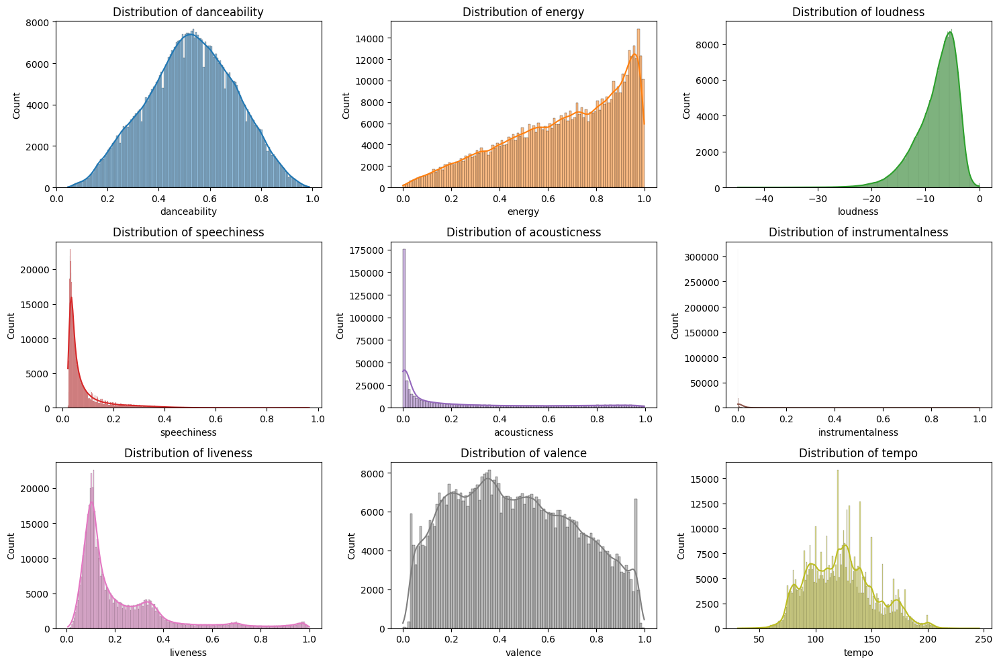

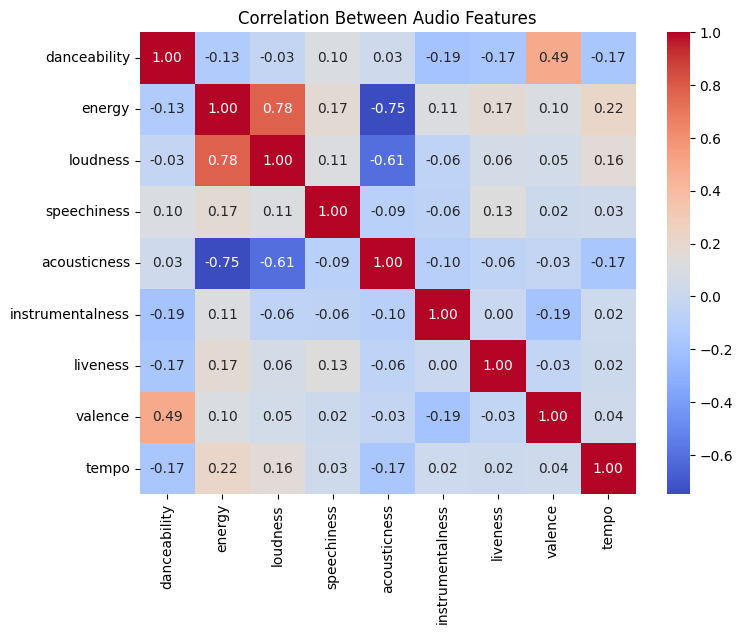

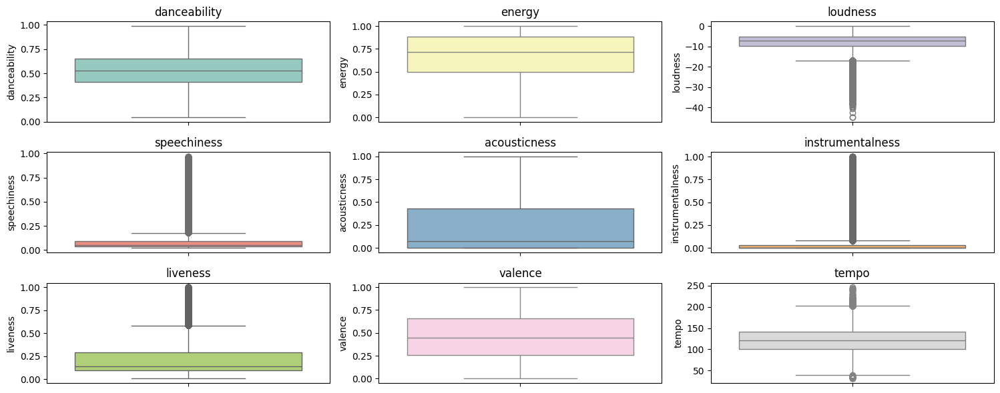

In [3]:
# Load Dataset
df = pd.read_csv("/kaggle/input/datasets/sabrina001/550k-music-dataset/songs.csv")  

# Keep only relevant numeric/audio features for this analysis and also they are the input dimension
audio_cols = ['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']

# Check for missing/null values
print("=== Missing Values per Column ===")
#print(df[audio_cols + ['lyrics','genre']].isnull().sum())
print(df.isnull().sum())

print("=== After Replacing Missing Values ===")
# Drop the 'id' column
df = df.drop(columns=['id'])

# Handle 'name' missing values (Replace with "Unknown")
df['name'] = df['name'].fillna("Unknown Name")

# Handle 'album_name' missing values (Replace with most common album)
df['album_name'] = df['album_name'].fillna(df['album_name'].mode()[0])

# Verify the results
print(df.isnull().sum())
print(df.head())

# Descriptive statistics
desc_stats = df[audio_cols].describe().T
print("=== Descriptive Statistics ===")
print(desc_stats)

# Add range (max - min) for each column
desc_stats['range'] = desc_stats['max'] - desc_stats['min']
print("\n=== Descriptive Stats with Range ===")
print(desc_stats)

# Feature Distribution Plots
plt.figure(figsize=(15,10))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Feature Distribution Plots (for all cols)
'''
cols = ['release_date','len']
plt.figure(figsize=(15,10))
for i, col in enumerate(cols):
    plt.subplot(1,2,i+1)
    sns.histplot(df[col], kde=True, color=sns.color_palette("tab10")[i])
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()
'''

# Correlation Heatmap
plt.figure(figsize=(8,6))
sns.heatmap(df[audio_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Between Audio Features")
plt.show()

# Boxplots to check for outliers
plt.figure(figsize=(15,6))
for i, col in enumerate(audio_cols):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df[col], color=sns.color_palette("Set3")[i])
    plt.title(col)
plt.tight_layout()
plt.show()


In [4]:
# Take small subset
df = df.sample(25000, random_state=42)

print(df.shape)
df.head

(25000, 23)


<bound method NDFrame.head of                             name  \
313554             Naive Monarch   
210119  I Can't Live Without You   
136837              Erase It All   
460801              The Majestic   
19995   Ain't What It Used To Be   
...                          ...   
425787          Stone Cold Fever   
385951                Satellites   
141658      Exhaustion & Disgust   
191135                      Heat   
54212                  Big Girls   

                                               album_name  \
313554                                           Versions   
210119                           I Can't Live Without You   
136837                                          Hail Mary   
460801                         Cup of Sand (2017 Reissue)   
19995                                    Billy Currington   
...                                                   ...   
425787  20th Century Masters:The Millennium Collection...   
385951                            Periphery IV: H

In [ ]:
# Audio Features Preprocessing
audio_features = df[['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']].values
scaler = StandardScaler()
audio_scaled = scaler.fit_transform(audio_features)

# Lyrics Preprocessing (TF-IDF)
'''tfidf = TfidfVectorizer(max_features=1000, stop_words='english')
lyrics_tfidf = tfidf.fit_transform(df['lyrics']).toarray()
print(f"Lyrics embedding shape: {lyrics_tfidf.shape}")
'''
# Lyrics Preprocessing (Sentence Transformer)
# Load pre-trained model
model = SentenceTransformer('all-MiniLM-L6-v2')  
# Convert lyrics column to list
lyrics_list = df['lyrics'].astype(str).tolist()

# Generate embeddings
lyrics_embeddings = model.encode(
    lyrics_list,
    batch_size=64,
    show_progress_bar=True
)

print("Lyrics embedding shape:", lyrics_embeddings.shape)

# Encode Genres
le = LabelEncoder()
genre_labels = le.fit_transform(df['genre'].values)
num_genres = len(le.classes_)
print(f"Number of genres: {num_genres}")

# One-hot encoding for CVAE
genre_onehot = np.eye(num_genres)[genre_labels]

# PyTorch Dataset
class MusicDataset(Dataset):
    def __init__(self, audio, lyrics, genre_onehot):
        self.audio = torch.tensor(audio, dtype=torch.float32)
        self.lyrics = torch.tensor(lyrics, dtype=torch.float32)
        self.genre = torch.tensor(genre_onehot, dtype=torch.float32)
    def __len__(self):
        return len(self.audio)
    def __getitem__(self, idx):
        return self.audio[idx], self.lyrics[idx], self.genre[idx]

dataset = MusicDataset(audio_scaled, lyrics_embeddings, genre_onehot)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True)

# Conditional VAE / Beta-VAE
class CVAE(nn.Module):
    def __init__(self, audio_dim, lyrics_dim, genre_dim, latent_dim=16, beta=1.0):
        super(CVAE, self).__init__()
        self.beta = beta

        # Encoder
        self.encoder = nn.Sequential(
            nn.Linear(audio_dim + lyrics_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU()
        )

        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_logvar = nn.Linear(128, latent_dim)

        # Decoder 
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim + genre_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, audio_dim + lyrics_dim)
        )

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z, genre_onehot):
        z = torch.cat([z, genre_onehot], dim=1)
        return self.decoder(z)

    def forward(self, x, genre_onehot):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z, genre_onehot)
        return recon, mu, logvar

# Loss function
def loss_function(recon, x, mu, logvar, beta=1.0):
    # MSE per sample
    MSE = torch.mean(torch.sum((recon - x)**2, dim=1))
    # KLD per sample
    KLD = -0.5 * torch.mean(torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1))
    return MSE + beta * KLD, MSE, KLD

audio_dim = audio_scaled.shape[1]
lyrics_dim = lyrics_embeddings.shape[1]
genre_dim = genre_onehot.shape[1]

print("Audio dim:", audio_dim)
print("Lyrics dim:", lyrics_dim)
print("Genre dim:", genre_dim)
print("Total CVAE input dim:", audio_dim + lyrics_dim + genre_dim)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/391 [00:00<?, ?it/s]

Lyrics embedding shape: (25000, 384)
Number of genres: 10
Audio dim: 9
Lyrics dim: 384
Genre dim: 10
Total CVAE input dim: 403


In [ ]:
# Training CVAE / Beta-VAE with separate MSE/KLD tracking
latent_dim = 16 
beta = 1.0  # Beta-VAE disentanglement factor

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CVAE(audio_dim, lyrics_dim, genre_dim, latent_dim, beta=beta).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

epochs = 50
losses_mse = []
losses_kld = []

for epoch in range(epochs):
    model.train()
    epoch_mse = 0
    epoch_kld = 0
    
    for audio, lyrics, genre in dataloader:
        audio, lyrics, genre = audio.to(device), lyrics.to(device), genre.to(device)
        x = torch.cat([audio, lyrics], dim=1)
        
        optimizer.zero_grad()
        recon, mu, logvar = model(x, genre)
        
        # Separate MSE and KLD
        loss, mse, kld = loss_function(recon, x, mu, logvar, beta=beta)
        loss.backward()
        optimizer.step()
        
        # Accumulate for epoch
        epoch_mse += mse.item() * x.size(0)
        epoch_kld += kld.item() * x.size(0)
    
    # Average over dataset
    epoch_mse /= len(dataset)
    epoch_kld /= len(dataset)
    
    losses_mse.append(epoch_mse)
    losses_kld.append(epoch_kld)
    
    
    print(f"Epoch {epoch+1}/{epochs}: MSE={losses_mse[-1]:.12f}, KLD={losses_kld[-1]:.12f}, Total={losses_mse[-1]+beta*losses_kld[-1]:.12f}")

# Extract Latent Representations
model.eval()
with torch.no_grad():
    audio_tensor = torch.tensor(audio_scaled, dtype=torch.float32).to(device)
    lyrics_tensor = torch.tensor(lyrics_embeddings, dtype=torch.float32).to(device)
    genre_tensor = torch.tensor(genre_onehot, dtype=torch.float32).to(device)
    X_input = torch.cat([audio_tensor, lyrics_tensor], dim=1)
    mu, _ = model.encode(X_input)
    latent_features = mu.cpu().numpy()
print(f"Latent features shape: {latent_features.shape}")
latent_features = StandardScaler().fit_transform(latent_features)

Epoch 1/50: MSE=8.619230627747, KLD=0.317236153595, Total=8.936466781342
Epoch 2/50: MSE=6.538974353027, KLD=1.013809220619, Total=7.552783573647
Epoch 3/50: MSE=5.589501340027, KLD=1.407546086121, Total=6.997047426147
Epoch 4/50: MSE=5.221457551117, KLD=1.556604003906, Total=6.778061555023
Epoch 5/50: MSE=4.998825131683, KLD=1.660805150185, Total=6.659630281868
Epoch 6/50: MSE=4.874571253662, KLD=1.727482070313, Total=6.602053323975
Epoch 7/50: MSE=4.769488858948, KLD=1.761080557861, Total=6.530569416809
Epoch 8/50: MSE=4.705369755249, KLD=1.788880770988, Total=6.494250526237
Epoch 9/50: MSE=4.644854480438, KLD=1.819541509094, Total=6.464395989532
Epoch 10/50: MSE=4.579801669464, KLD=1.852010872116, Total=6.431812541580
Epoch 11/50: MSE=4.539130003510, KLD=1.878020135612, Total=6.417150139122
Epoch 12/50: MSE=4.521123385468, KLD=1.880317564011, Total=6.401440949478
Epoch 13/50: MSE=4.491908155823, KLD=1.893737044983, Total=6.385645200806
Epoch 14/50: MSE=4.459035839233, KLD=1.91525615

In [9]:
# Clustering on Latent Space
k = num_genres
# KMeans
kmeans = KMeans(n_clusters=k, random_state=42).fit(latent_features)
cluster_labels = kmeans.labels_

# Spectral Clustering
spectral = SpectralClustering(n_clusters=k, affinity='nearest_neighbors', random_state=42).fit(latent_features)
spectral_labels = spectral.labels_

# Baseline: PCA + KMeans
X_concat = np.concatenate([audio_scaled, lyrics_embeddings], axis=1)
pca = PCA(n_components=latent_dim)
X_pca = pca.fit_transform(X_concat)
kmeans_pca = KMeans(n_clusters=k, random_state=42).fit(X_pca)
labels_pca = kmeans_pca.labels_

# Baseline: Autoencoder + KMeans
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim=16):
        super(Autoencoder, self).__init__()
        
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 128),  
            nn.ReLU(),
            nn.Linear(128, latent_dim)
        )

        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.ReLU(),
            nn.Linear(128, input_dim)
        )

        
    def forward(self, x):
        z = self.encoder(x)
        recon = self.decoder(z)
        return recon, z


ae_model = Autoencoder(X_concat.shape[1], latent_dim).to(device)
ae_optimizer = torch.optim.Adam(ae_model.parameters(), lr=1e-3)
X_tensor = torch.tensor(X_concat, dtype=torch.float32).to(device)
losses = []
for epoch in range(50):
    ae_optimizer.zero_grad()
    recon, z = ae_model(X_tensor)
    loss = nn.MSELoss()(recon, X_tensor)
    loss.backward()
    ae_optimizer.step()
    losses.append(loss.item())  # To store loss
    
    print(f"Epoch {epoch+1}/50, Reconstruction Loss: {loss.item():.6f}")

latent_ae = ae_model.encoder(X_tensor).detach().cpu().numpy()
kmeans_ae = KMeans(n_clusters=k, random_state=42).fit(latent_ae)
labels_ae = kmeans_ae.labels_

Epoch 1/50, Reconstruction Loss: 0.032048
Epoch 2/50, Reconstruction Loss: 0.030547
Epoch 3/50, Reconstruction Loss: 0.029339
Epoch 4/50, Reconstruction Loss: 0.028361
Epoch 5/50, Reconstruction Loss: 0.027563
Epoch 6/50, Reconstruction Loss: 0.026907
Epoch 7/50, Reconstruction Loss: 0.026360
Epoch 8/50, Reconstruction Loss: 0.025901
Epoch 9/50, Reconstruction Loss: 0.025511
Epoch 10/50, Reconstruction Loss: 0.025179
Epoch 11/50, Reconstruction Loss: 0.024894
Epoch 12/50, Reconstruction Loss: 0.024647
Epoch 13/50, Reconstruction Loss: 0.024430
Epoch 14/50, Reconstruction Loss: 0.024237
Epoch 15/50, Reconstruction Loss: 0.024058
Epoch 16/50, Reconstruction Loss: 0.023889
Epoch 17/50, Reconstruction Loss: 0.023723
Epoch 18/50, Reconstruction Loss: 0.023554
Epoch 19/50, Reconstruction Loss: 0.023378
Epoch 20/50, Reconstruction Loss: 0.023192
Epoch 21/50, Reconstruction Loss: 0.022992
Epoch 22/50, Reconstruction Loss: 0.022777
Epoch 23/50, Reconstruction Loss: 0.022543
Epoch 24/50, Reconst

In [10]:
# Evaluation Metrics Function
def evaluate(features, y_true, y_pred):
    sil = silhouette_score(features, y_pred)
    nmi = normalized_mutual_info_score(y_true, y_pred)
    ari = adjusted_rand_score(y_true, y_pred)
    # Cluster Purity
    def purity_score(y_true, y_pred):
        # compute contingency matrix
        contingency_matrix = pd.crosstab(y_true, y_pred)
        return np.sum(np.amax(contingency_matrix.values, axis=0)) / np.sum(contingency_matrix.values)
    purity = purity_score(y_true, y_pred)
    return sil, nmi, ari, purity

results = {}

results["CVAE Clustering"] = evaluate(latent_features, genre_labels, cluster_labels)
results["Spectral Clustering"] = evaluate(latent_features, genre_labels, spectral_labels)
results["PCA + KMeans"] = evaluate(X_pca, genre_labels, labels_pca)
results["AE + KMeans"] = evaluate(latent_ae, genre_labels, labels_ae)

for method, (sil, nmi, ari, purity) in results.items():
    print(f"{method}:")
    print(f"  Silhouette Score: {sil:}")
    print(f"  NMI:        {nmi:}")
    print(f"  ARI:        {ari:}")
    print(f"  Purity:     {purity:}")
    print()

CVAE Clustering:
  Silhouette Score: 0.18922759592533112
  NMI:        0.06591421597728678
  ARI:        0.028540130537011755
  Purity:     0.36272

Spectral Clustering:
  Silhouette Score: 0.20987126231193542
  NMI:        0.07215306243445342
  ARI:        0.02023478890314236
  Purity:     0.36216

PCA + KMeans:
  Silhouette Score: 0.15178914619213865
  NMI:        0.12135731300548541
  ARI:        0.06535150948601906
  Purity:     0.40256

AE + KMeans:
  Silhouette Score: 0.24059619009494781
  NMI:        0.13401164721196293
  ARI:        0.082071938258856
  Purity:     0.40184



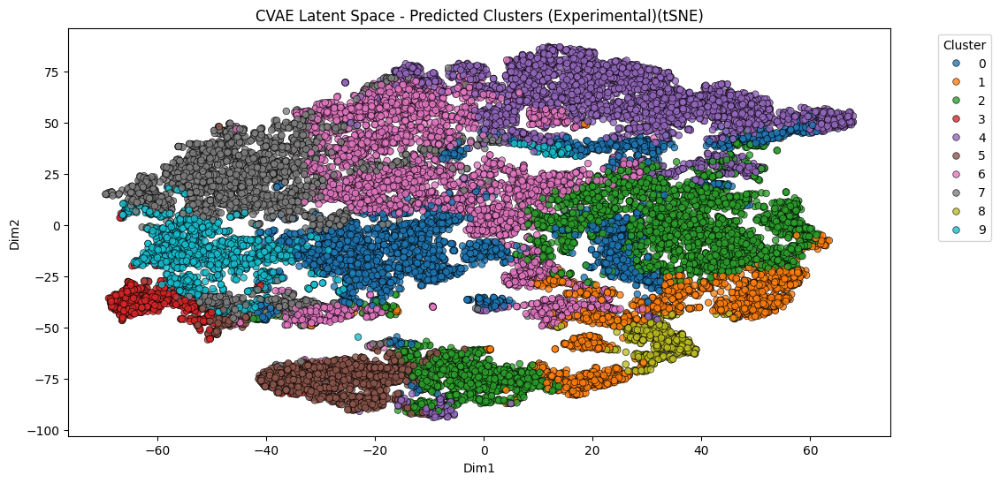

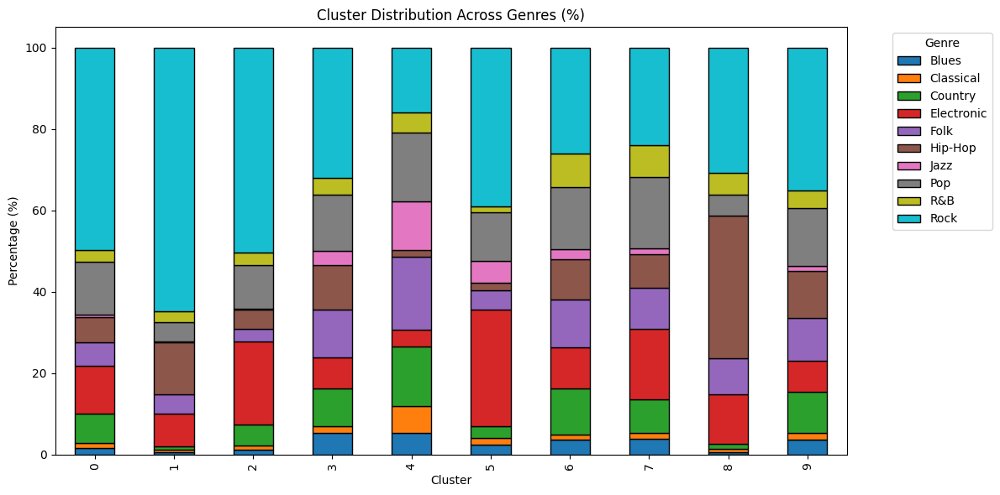

===== Cluster to Genre Mapping (Experimental)=====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         51         44      231         382   188      196    25  416  100   
1         12         12       14         153    88      241     2   91   50   
2         52         47      223         887   138      203    11  464  139   
3         31         10       55          44    70       64    20   82   24   
4        214        268      590         165   723       69   480  682  200   
5         32         24       37         389    63       26    70  162   21   
6        166         54      494         451   513      435   112  678  364   
7        115         45      247         520   298      248    45  526  234   
8          3          5        7          70    52      202     0   30   30   
9         59         25      160         120   166      182    19  224   66   



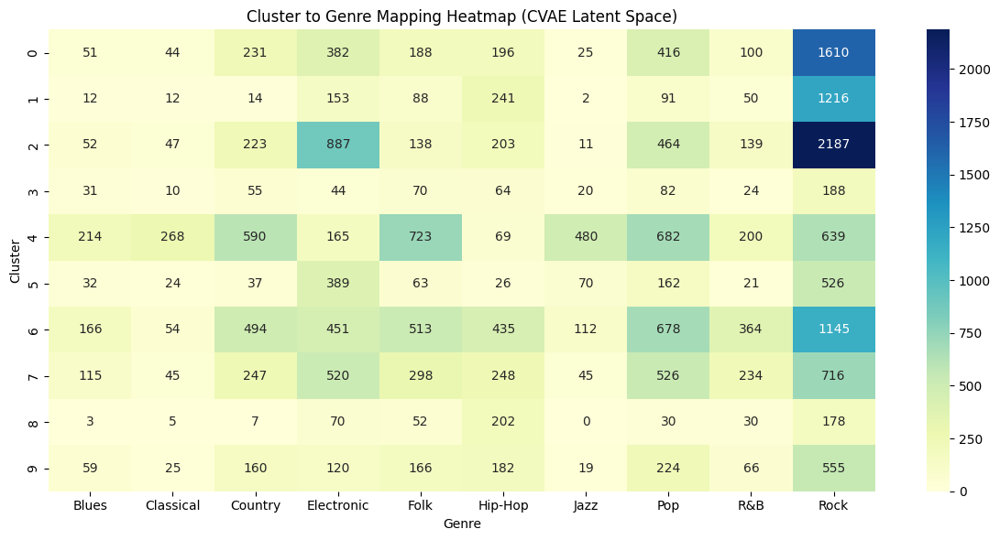


Cluster Composition Percentages (CVAE Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        1.572618   1.356768   7.123034   11.779217   5.797101   6.043787   
1        0.638638   0.638638   0.745077    8.142629   4.683342  12.825971   
2        1.195128   1.080211   5.125259   20.386118   3.171685   4.665594   
3        5.272109   1.700680   9.353741    7.482993  11.904762  10.884354   
4        5.310174   6.650124  14.640199    4.094293  17.940447   1.712159   
5        2.370370   1.777778   2.740741   28.814815   4.666667   1.925926   
6        3.762466   1.223935  11.196736   10.222121  11.627380   9.859474   
7        3.841015   1.503006   8.249833   17.368069   9.953240   8.283233   
8        0.519931   0.866551   1.213172   12.131716   9.012132  35.008666   
9        3.743655   1.586294  10.152284    7.614213  10.532995  11.548223   

genre   

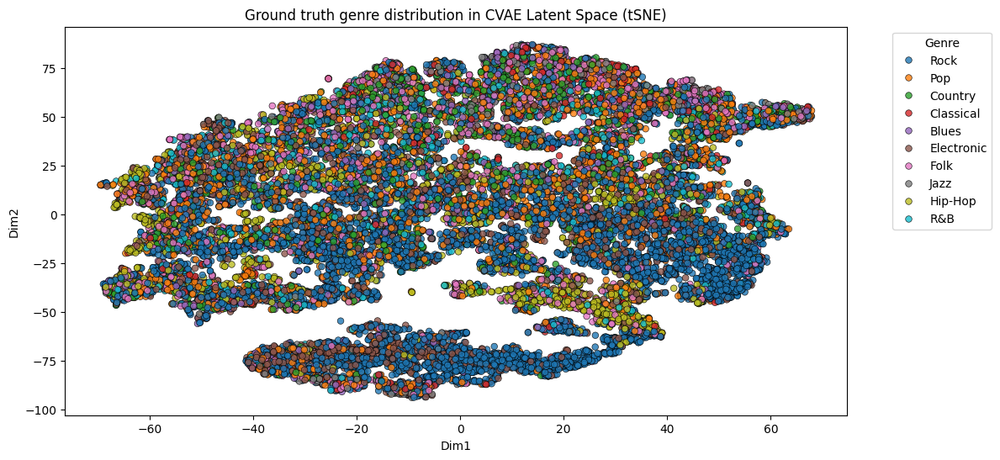

===== Numeric counts per Ground Truth Genre (CVAE Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (CVAE Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


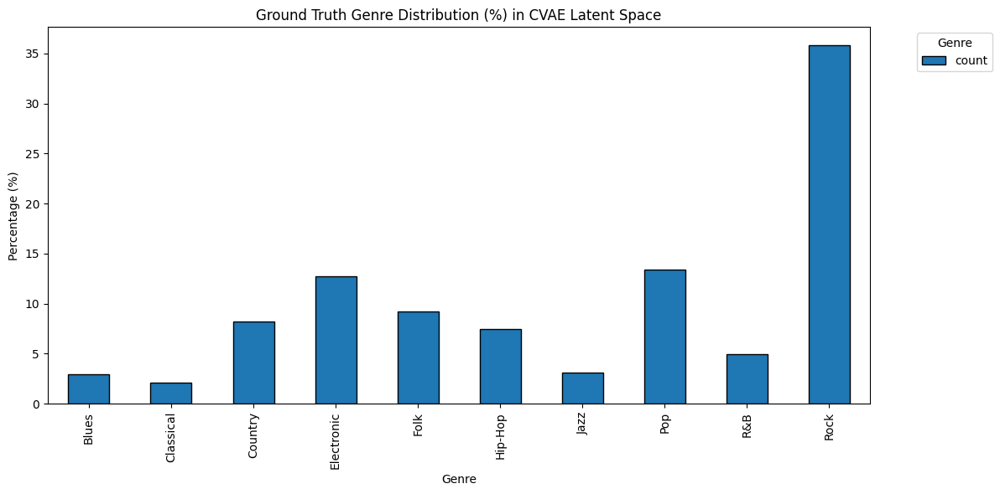

In [ ]:
# Visualizations
# t-SNE on CVAE latent space
def visualize_and_map_clusters(latent_features, cluster_labels, true_labels, title_prefix="Latent Space"):
    
    tsne = TSNE(n_components=2, perplexity =80, random_state=42)
    features_2d = tsne.fit_transform(latent_features)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=cluster_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"{title_prefix} - Predicted Clusters (Experimental)(tSNE)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    # Cluster distribution over genres (Stacked Bar Plot) 
    cluster_genre = pd.DataFrame({
        'cluster': cluster_labels,
        'genre': true_labels
    })
    
    # Create contingency table
    cluster_counts = pd.crosstab(cluster_genre['cluster'], cluster_genre['genre'])
    
    # Convert to percentage
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
    
    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(12,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title("Cluster Distribution Across Genres (%)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    cluster_to_genre = pd.crosstab(cluster_labels, true_labels)
    print(f"===== Cluster to Genre Mapping (Experimental)=====")
    print(cluster_to_genre)

    # Heatmap of cluster vs genre
    plt.figure(figsize=(12,6))
    sns.heatmap(cluster_to_genre, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster to Genre Mapping Heatmap ({title_prefix})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.tight_layout()
    plt.show()

    print(f"\nCluster Composition Percentages ({title_prefix}) Experimental:")
    print(cluster_percent)

    predominant = cluster_to_genre.idxmax(axis=1)
    print("\nPredominant genre per cluster (Experimental):")
    print(predominant)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=true_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"Ground truth genre distribution in {title_prefix} (tSNE)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    # Numeric counts and stacked bar for ground truth 
    gt_counts = pd.crosstab(index=true_labels, columns="count")
    print(f"===== Numeric counts per Ground Truth Genre ({title_prefix}) =====")
    print(gt_counts)
    
    gt_percent = gt_counts.div(gt_counts.sum(axis=0), axis=1) * 100
    print(f"\nGround Truth Genre Distribution Percentages ({title_prefix}):")
    print(gt_percent)
    
    gt_percent.plot(
        kind='bar', stacked=True, figsize=(12,6),
        colormap='tab10', edgecolor='black'
    )
    plt.title(f"Ground Truth Genre Distribution (%) in {title_prefix}")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Genre")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
visualize_and_map_clusters(latent_features, cluster_labels, df['genre'], title_prefix="CVAE Latent Space")


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


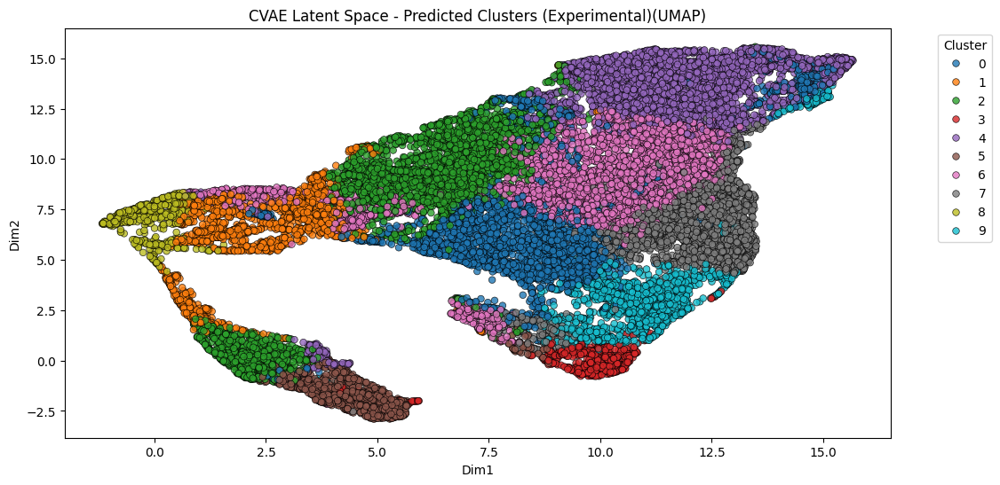

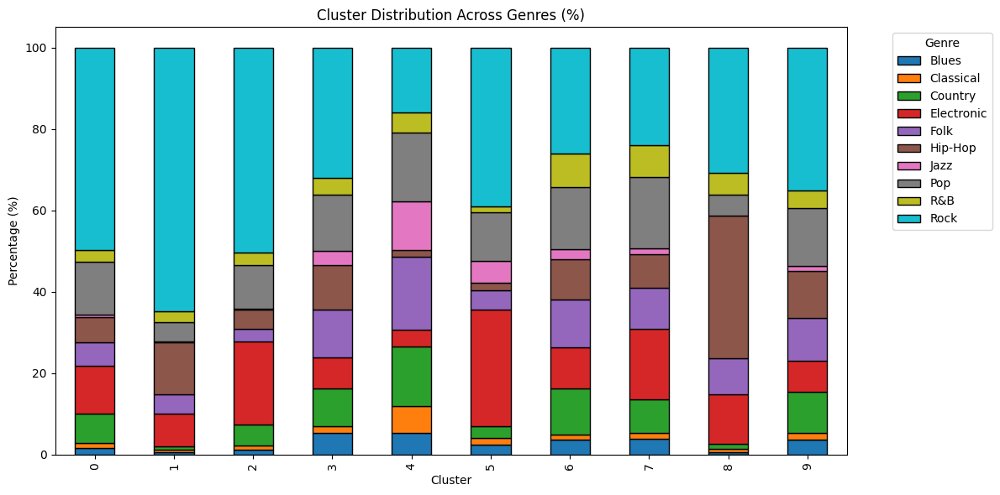

===== Cluster to Genre Mapping (Experimental)=====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         51         44      231         382   188      196    25  416  100   
1         12         12       14         153    88      241     2   91   50   
2         52         47      223         887   138      203    11  464  139   
3         31         10       55          44    70       64    20   82   24   
4        214        268      590         165   723       69   480  682  200   
5         32         24       37         389    63       26    70  162   21   
6        166         54      494         451   513      435   112  678  364   
7        115         45      247         520   298      248    45  526  234   
8          3          5        7          70    52      202     0   30   30   
9         59         25      160         120   166      182    19  224   66   



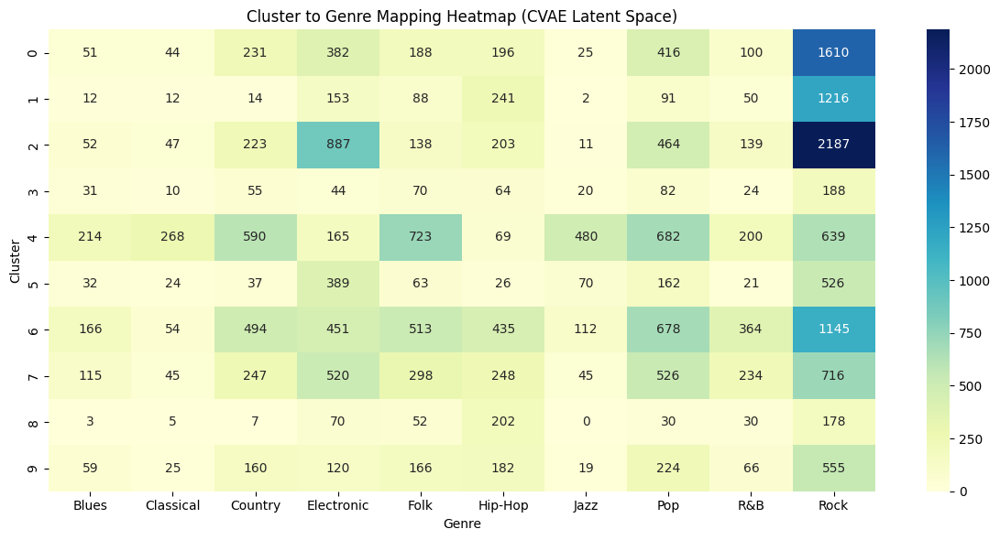


Cluster Composition Percentages (CVAE Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        1.572618   1.356768   7.123034   11.779217   5.797101   6.043787   
1        0.638638   0.638638   0.745077    8.142629   4.683342  12.825971   
2        1.195128   1.080211   5.125259   20.386118   3.171685   4.665594   
3        5.272109   1.700680   9.353741    7.482993  11.904762  10.884354   
4        5.310174   6.650124  14.640199    4.094293  17.940447   1.712159   
5        2.370370   1.777778   2.740741   28.814815   4.666667   1.925926   
6        3.762466   1.223935  11.196736   10.222121  11.627380   9.859474   
7        3.841015   1.503006   8.249833   17.368069   9.953240   8.283233   
8        0.519931   0.866551   1.213172   12.131716   9.012132  35.008666   
9        3.743655   1.586294  10.152284    7.614213  10.532995  11.548223   

genre   

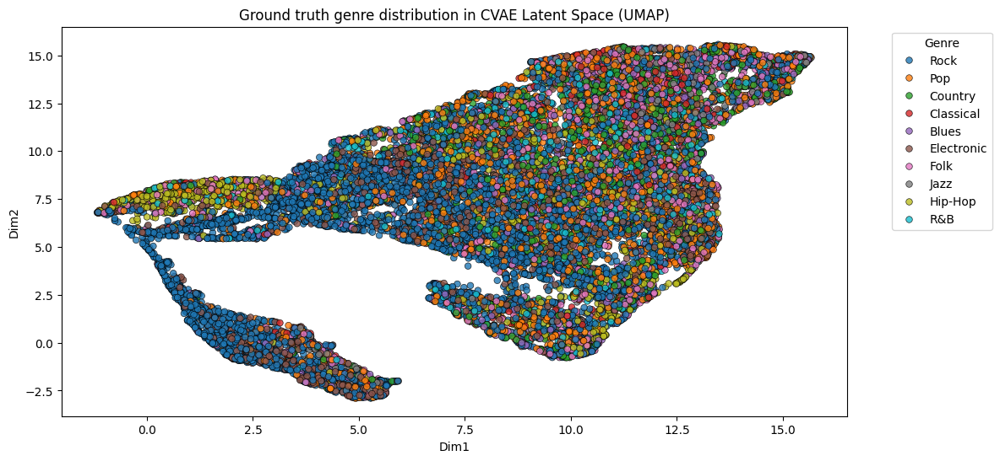

===== Numeric counts per Ground Truth Genre (CVAE Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (CVAE Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


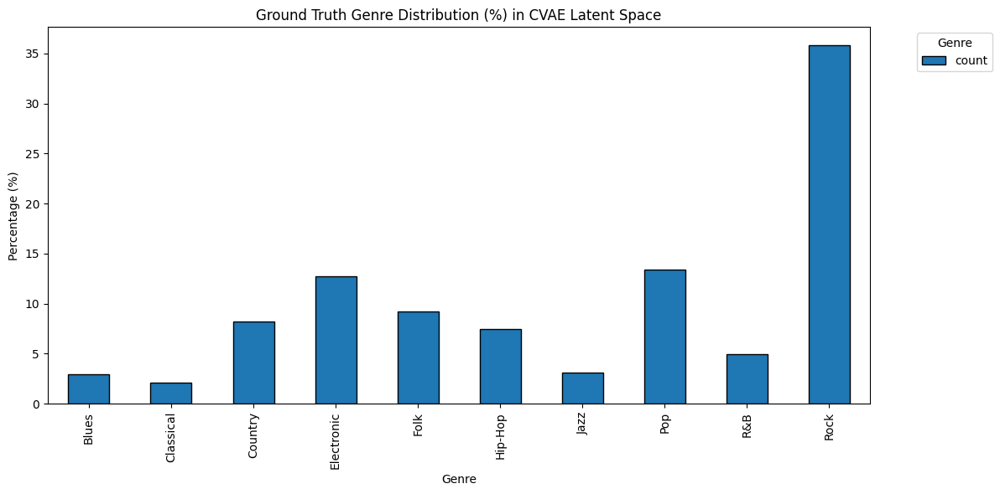

In [ ]:
# Visualizations
# UMAP on CVAE latent space
def visualize_and_map_clusters(latent_features, cluster_labels, true_labels, title_prefix="Latent Space"):
    
    reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, random_state=42)
    features_2d = reducer.fit_transform(latent_features)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=cluster_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"{title_prefix} - Predicted Clusters (Experimental)(UMAP)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    # Cluster distribution over genres (Stacked Bar Plot) 
    cluster_genre = pd.DataFrame({
        'cluster': cluster_labels,
        'genre': true_labels
    })
    
    # Create contingency table
    cluster_counts = pd.crosstab(cluster_genre['cluster'], cluster_genre['genre'])
    
    # Convert to percentage
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
    
    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(12,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title("Cluster Distribution Across Genres (%)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    cluster_to_genre = pd.crosstab(cluster_labels, true_labels)
    print(f"===== Cluster to Genre Mapping (Experimental)=====")
    print(cluster_to_genre)

    # Heatmap of cluster vs genre
    plt.figure(figsize=(12,6))
    sns.heatmap(cluster_to_genre, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster to Genre Mapping Heatmap ({title_prefix})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.tight_layout()
    plt.show()

    print(f"\nCluster Composition Percentages ({title_prefix}) Experimental:")
    print(cluster_percent)

    predominant = cluster_to_genre.idxmax(axis=1)
    print("\nPredominant genre per cluster (Experimental):")
    print(predominant)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=true_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"Ground truth genre distribution in {title_prefix} (UMAP)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    # Numeric counts and stacked bar for ground truth
    gt_counts = pd.crosstab(index=true_labels, columns="count")
    print(f"===== Numeric counts per Ground Truth Genre ({title_prefix}) =====")
    print(gt_counts)
    
    gt_percent = gt_counts.div(gt_counts.sum(axis=0), axis=1) * 100
    print(f"\nGround Truth Genre Distribution Percentages ({title_prefix}):")
    print(gt_percent)
    
    gt_percent.plot(
        kind='bar', stacked=True, figsize=(12,6),
        colormap='tab10', edgecolor='black'
    )
    plt.title(f"Ground Truth Genre Distribution (%) in {title_prefix}")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Genre")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
visualize_and_map_clusters(latent_features, cluster_labels, df['genre'], title_prefix="CVAE Latent Space")


Original vs Reconstructed feature shapes:
(10, 393) (10, 393)


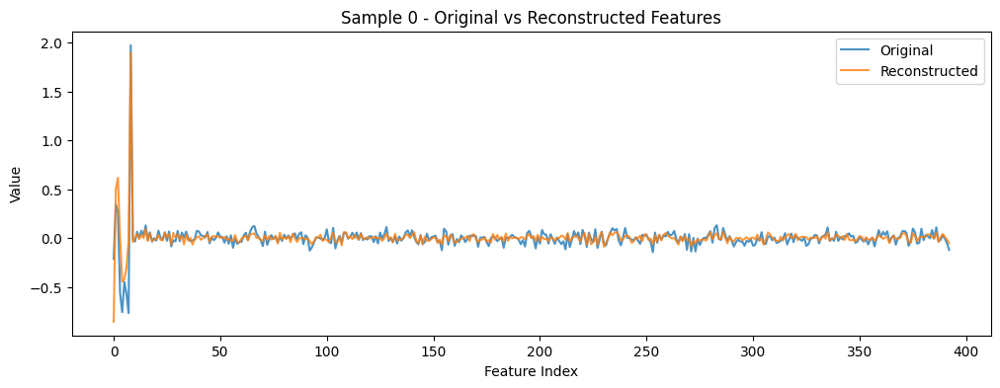

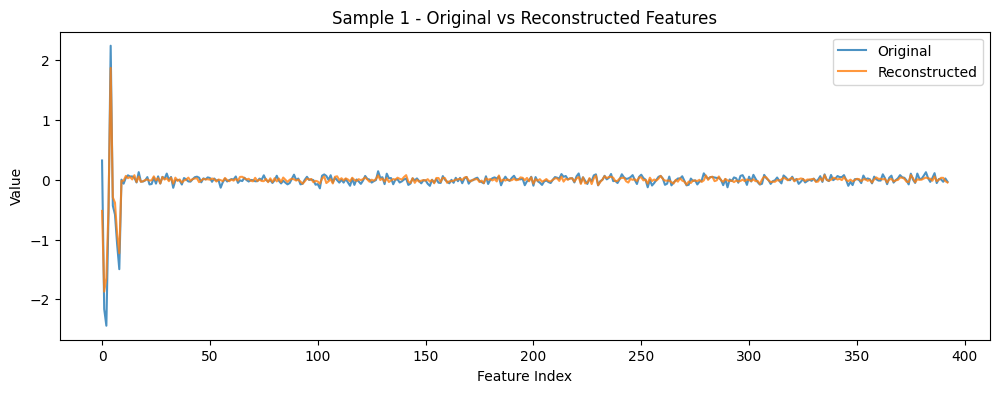

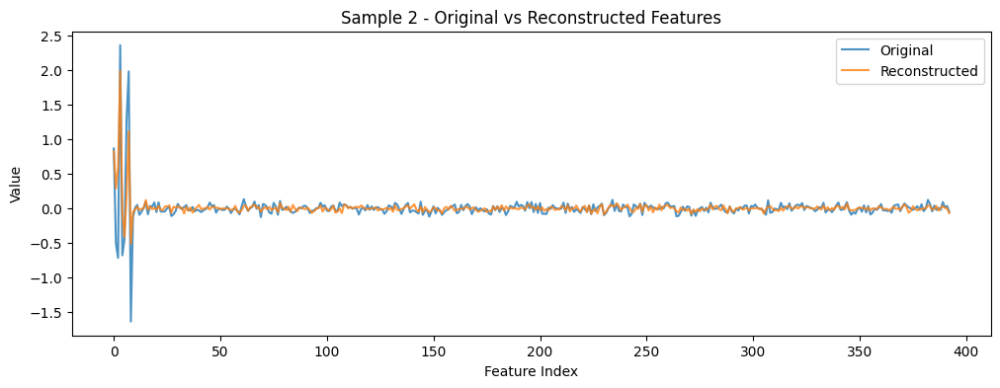

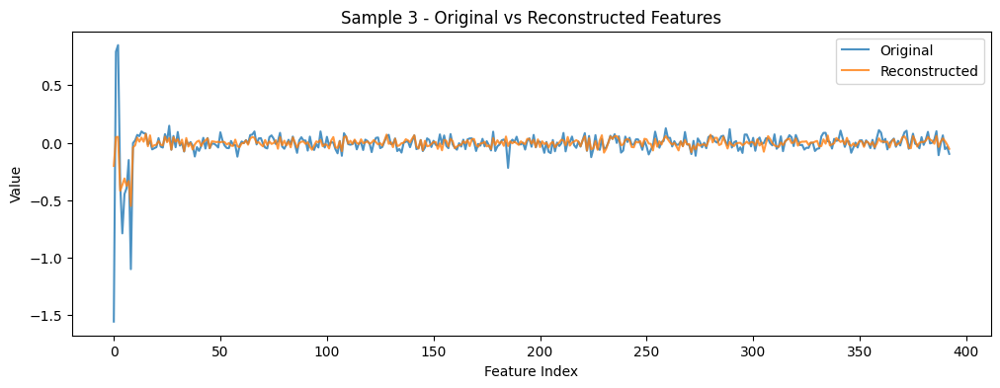

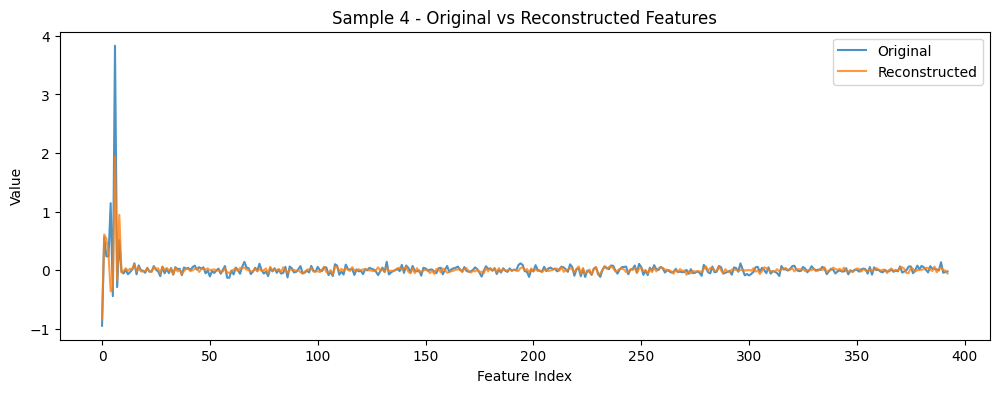

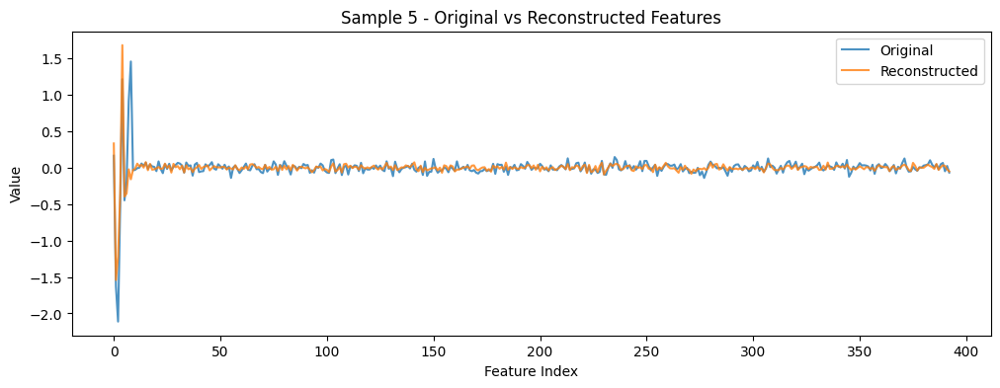

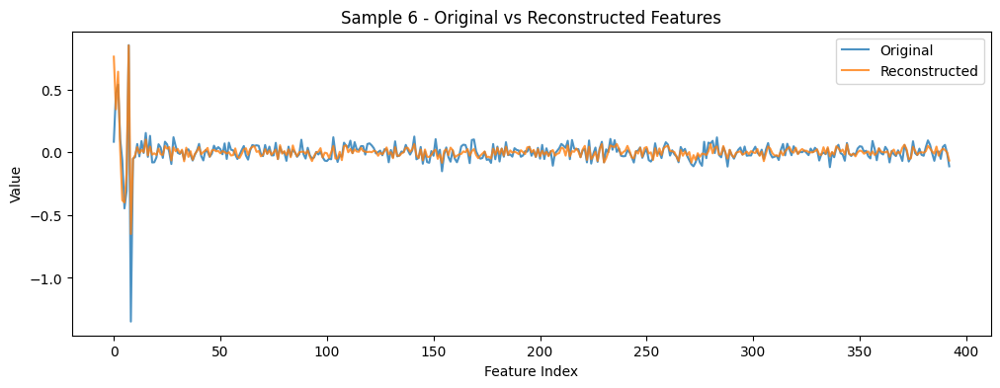

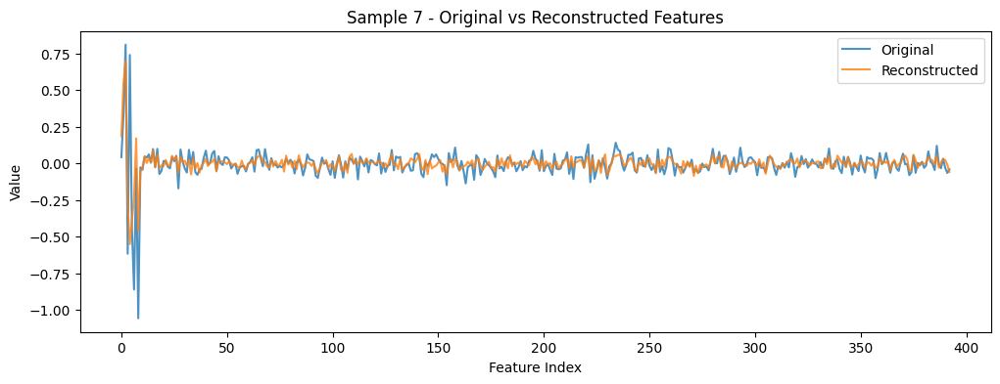

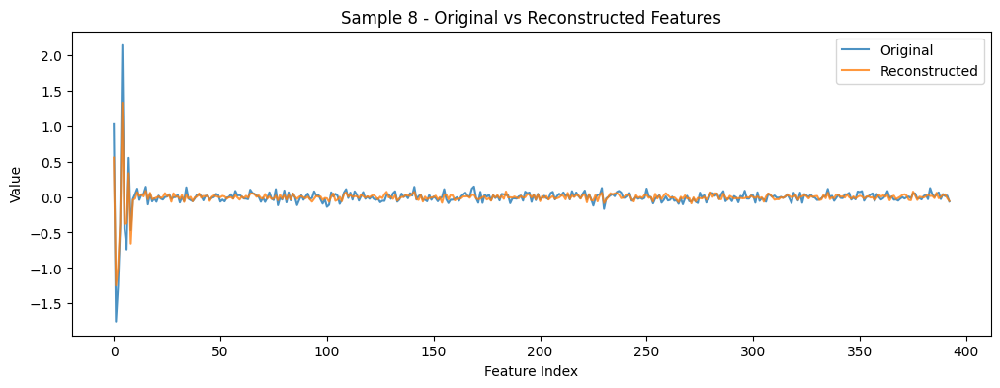

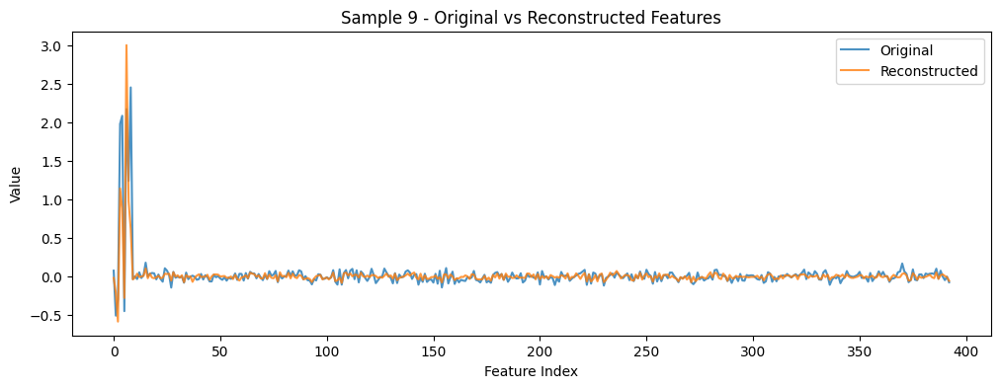

In [23]:
# Reconstruction examples from CVAE latent space
num_samples = 10
sample_idx = np.random.randint(0, len(dataset), num_samples)
with torch.no_grad():
    audio_sample = torch.tensor(audio_scaled[sample_idx], dtype=torch.float32).to(device)
    lyrics_sample = torch.tensor(lyrics_embeddings[sample_idx], dtype=torch.float32).to(device)
    genre_sample = torch.tensor(genre_onehot[sample_idx], dtype=torch.float32).to(device)
    x_sample = torch.cat([audio_sample, lyrics_sample], dim=1)
    recon, _, _ = model(x_sample, genre_sample)
    recon = recon.cpu().numpy()
    print("Original vs Reconstructed feature shapes:")
    print(x_sample.cpu().numpy().shape, recon.shape)

for i in range(num_samples):
    plt.figure(figsize=(12,4))
    plt.plot(x_sample[i].cpu().numpy(), label='Original', alpha=0.8)
    plt.plot(recon[i], label='Reconstructed', alpha=0.8)
    plt.title(f'Sample {i} - Original vs Reconstructed Features')
    plt.xlabel('Feature Index')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

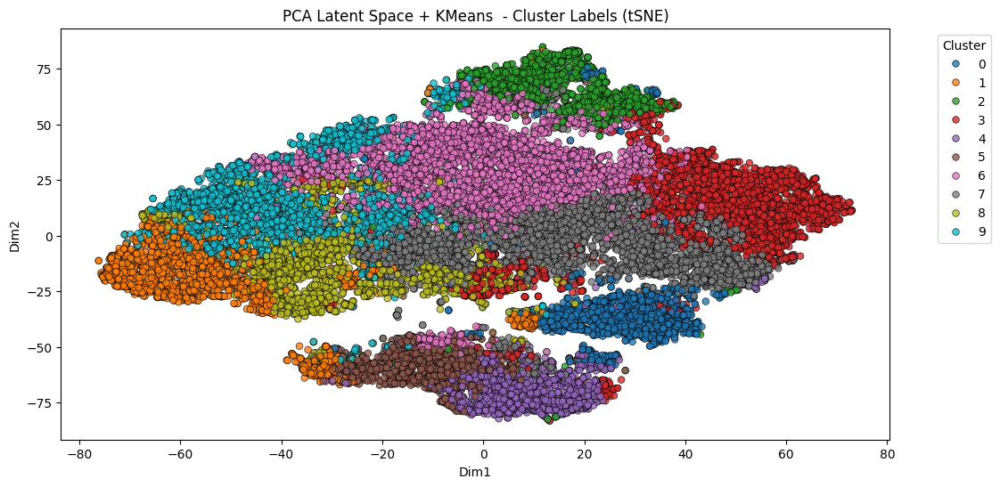

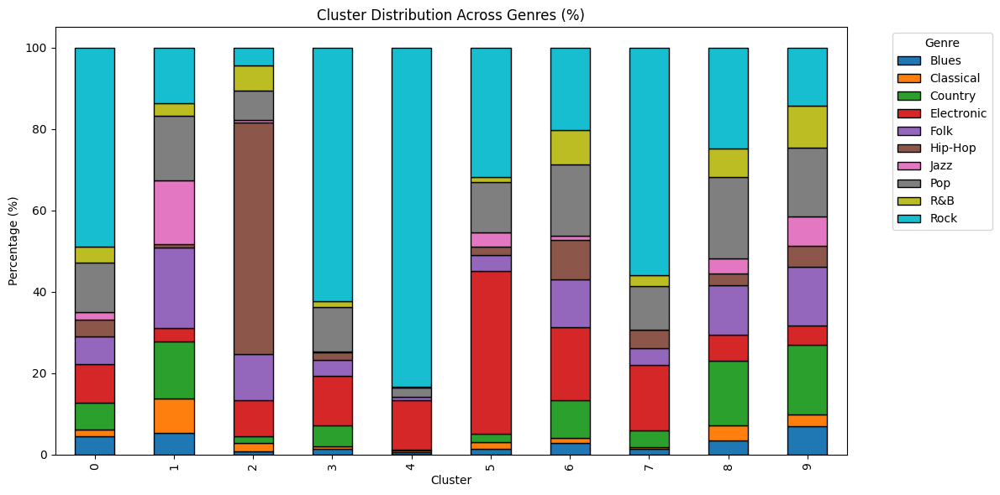

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         71         25      102         150   105       65    29  189   61   
1        125        198      326          79   461       19   367  373   71   
2         11         33       23         134   170      853    11  107   93   
3         47         19      160         386   118       62     4  346   42   
4          8          5        5         173    12        0     0   35    1   
5         16         21       24         478    47       26    41  148   16   
6        133         53      437         825   549      445    51  813  390   
7         57         22      180         694   182      195     2  465  118   
8         71         73      320         125   245       58    75  400  142   
9        196         85      481         137   410      143   204  479  294   

genre  Rock  


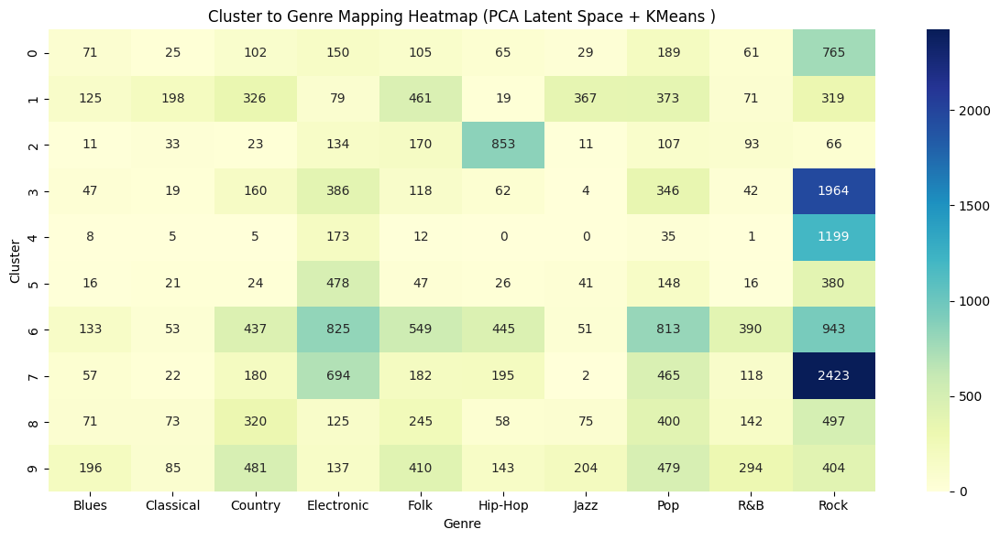


Cluster Composition Percentages (PCA Latent Space + KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        4.545455   1.600512   6.530090    9.603073   6.722151   4.161332   
1        5.346450   8.468777  13.943541    3.378956  19.717707   0.812660   
2        0.732845   2.198534   1.532312    8.927382  11.325783  56.828781   
3        1.493011   0.603558   5.082592   12.261753   3.748412   1.969504   
4        0.556328   0.347705   0.347705   12.030598   0.834492   0.000000   
5        1.336675   1.754386   2.005013   39.933166   3.926483   2.172097   
6        2.866997   1.142488   9.420134   17.784005  11.834447   9.592585   
7        1.313970   0.507146   4.149378   15.998156   4.195482   4.495159   
8        3.539382   3.639083  15.952144    6.231306  12.213360   2.891326   
9        6.918461   3.000353  16.978468    4.835863  14.472291   5.047653   


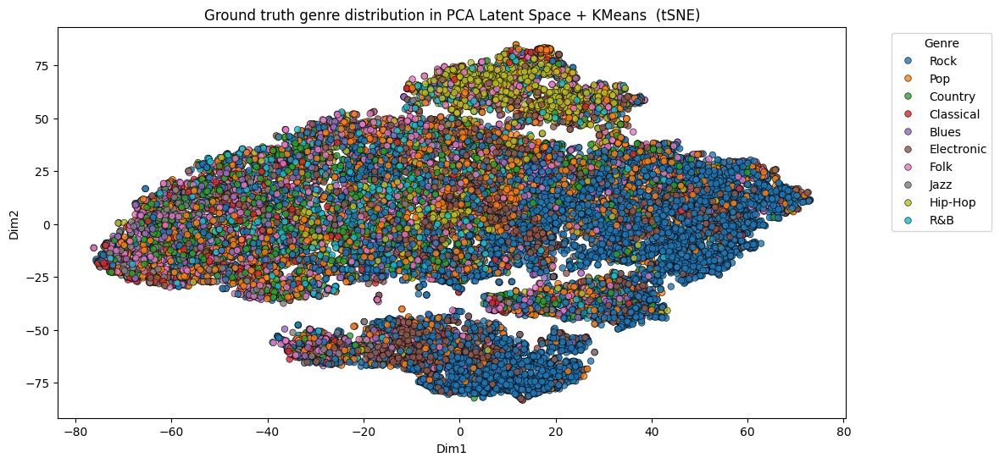

===== Numeric counts per Ground Truth Genre (PCA Latent Space + KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (PCA Latent Space + KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


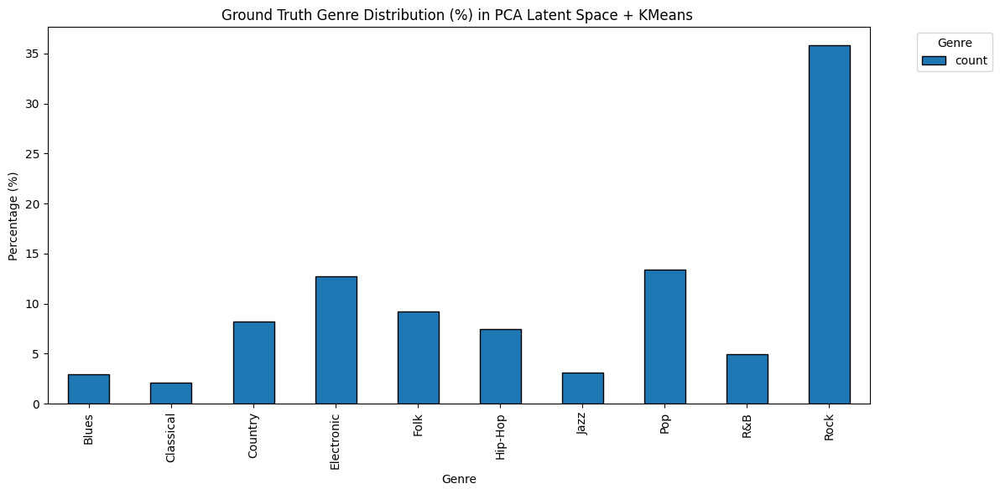

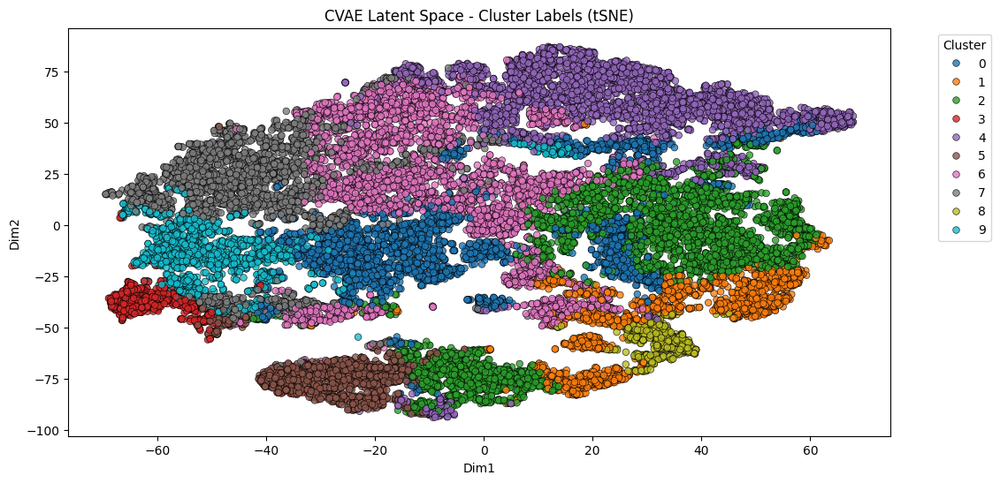

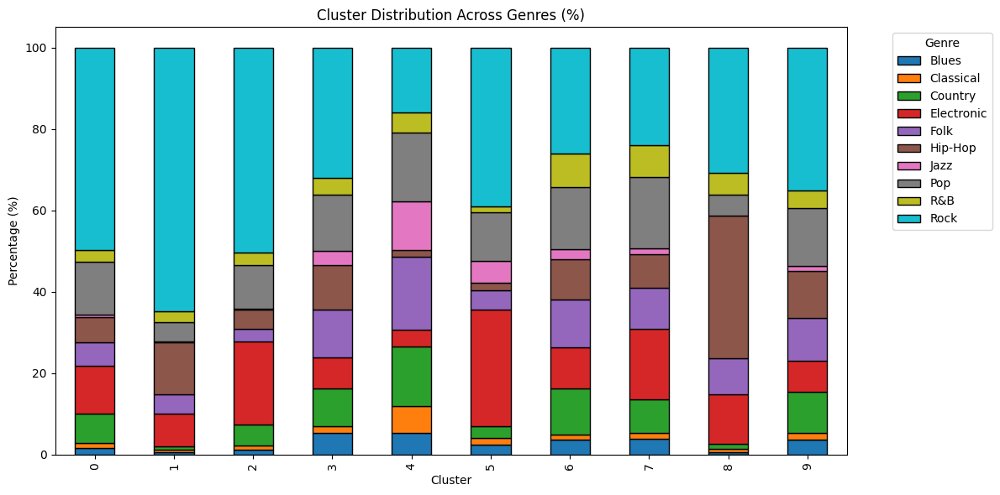

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         51         44      231         382   188      196    25  416  100   
1         12         12       14         153    88      241     2   91   50   
2         52         47      223         887   138      203    11  464  139   
3         31         10       55          44    70       64    20   82   24   
4        214        268      590         165   723       69   480  682  200   
5         32         24       37         389    63       26    70  162   21   
6        166         54      494         451   513      435   112  678  364   
7        115         45      247         520   298      248    45  526  234   
8          3          5        7          70    52      202     0   30   30   
9         59         25      160         120   166      182    19  224   66   

genre  Rock  


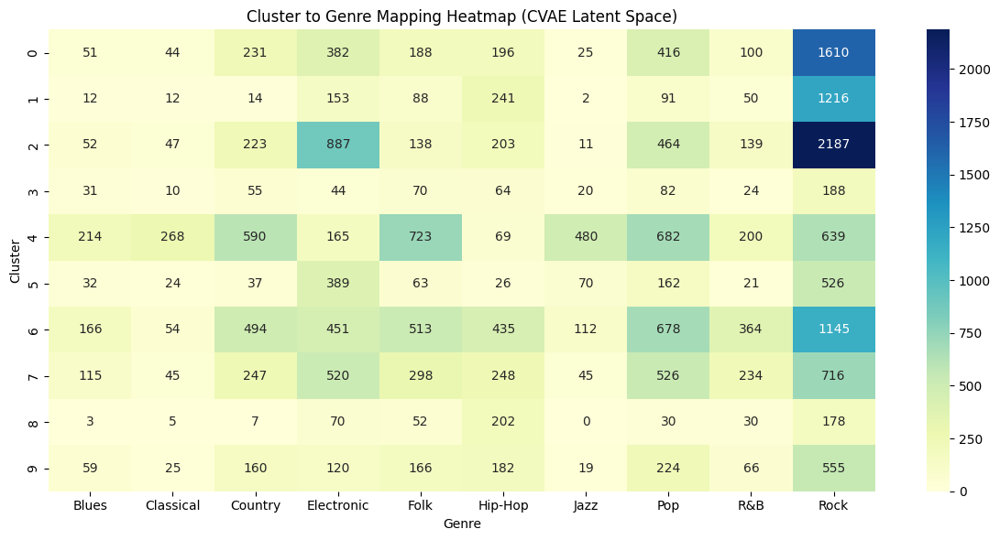


Cluster Composition Percentages (CVAE Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        1.572618   1.356768   7.123034   11.779217   5.797101   6.043787   
1        0.638638   0.638638   0.745077    8.142629   4.683342  12.825971   
2        1.195128   1.080211   5.125259   20.386118   3.171685   4.665594   
3        5.272109   1.700680   9.353741    7.482993  11.904762  10.884354   
4        5.310174   6.650124  14.640199    4.094293  17.940447   1.712159   
5        2.370370   1.777778   2.740741   28.814815   4.666667   1.925926   
6        3.762466   1.223935  11.196736   10.222121  11.627380   9.859474   
7        3.841015   1.503006   8.249833   17.368069   9.953240   8.283233   
8        0.519931   0.866551   1.213172   12.131716   9.012132  35.008666   
9        3.743655   1.586294  10.152284    7.614213  10.532995  11.548223   

genre   

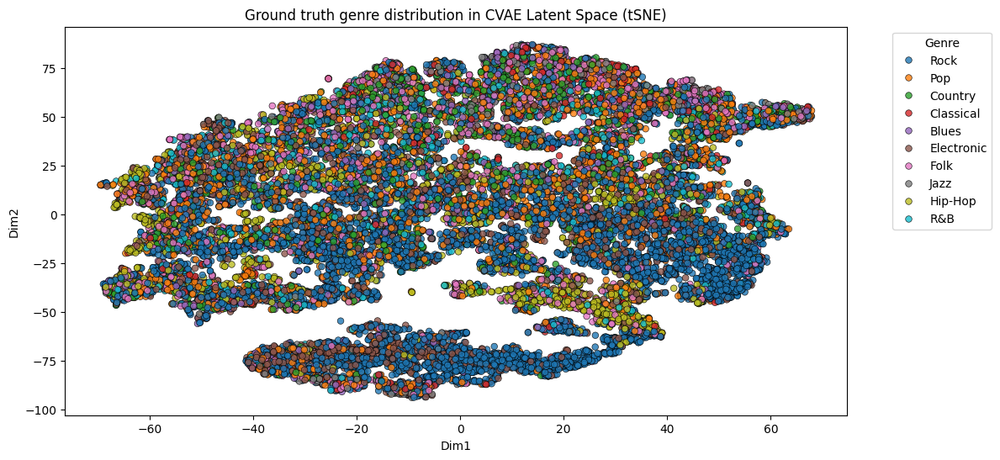

===== Numeric counts per Ground Truth Genre (CVAE Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (CVAE Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


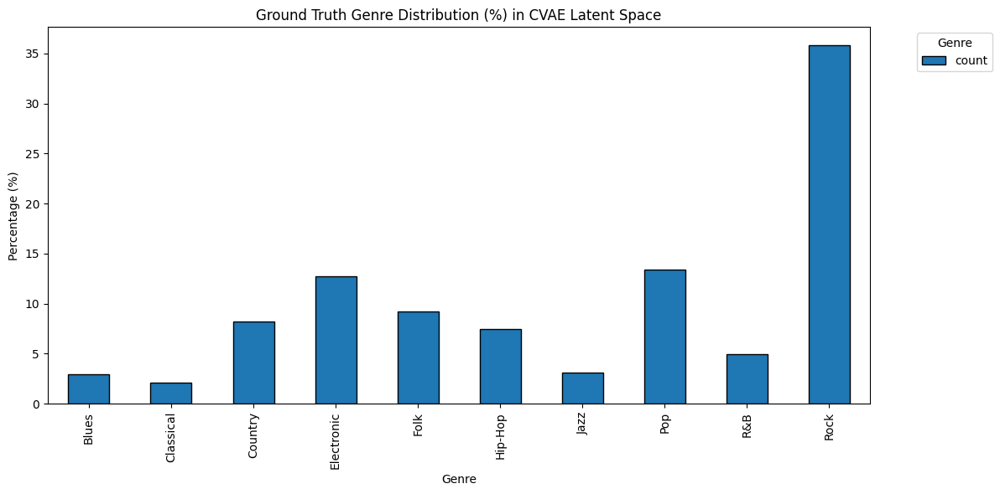

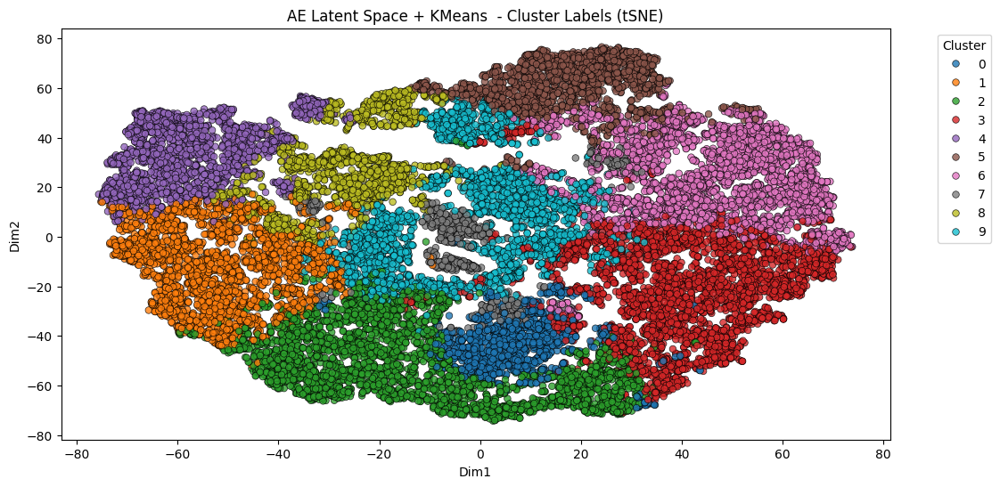

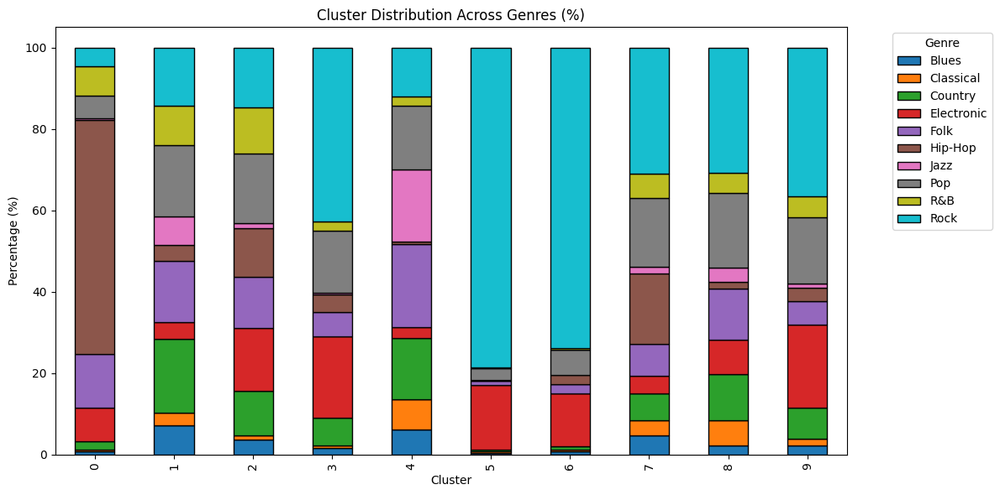

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         10          7       25         111   175      760     6   73   94   
1        206         89      522         123   430      115   203  501  278   
2        134         43      401         573   466      445    51  633  422   
3         65         24      255         766   225      171    11  590   84   
4        139        171      348          63   466       13   409  360   53   
5          8          9        7         307    19        3     0   58    2   
6         30         11       33         474    76       88     0  225   12   
7         40         31       56          36    68      145    15  142   52   
8         39        103      193         143   211       27    61  307   85   
9         64         46      218         585   163       99    28  466  146   

genre  Rock  


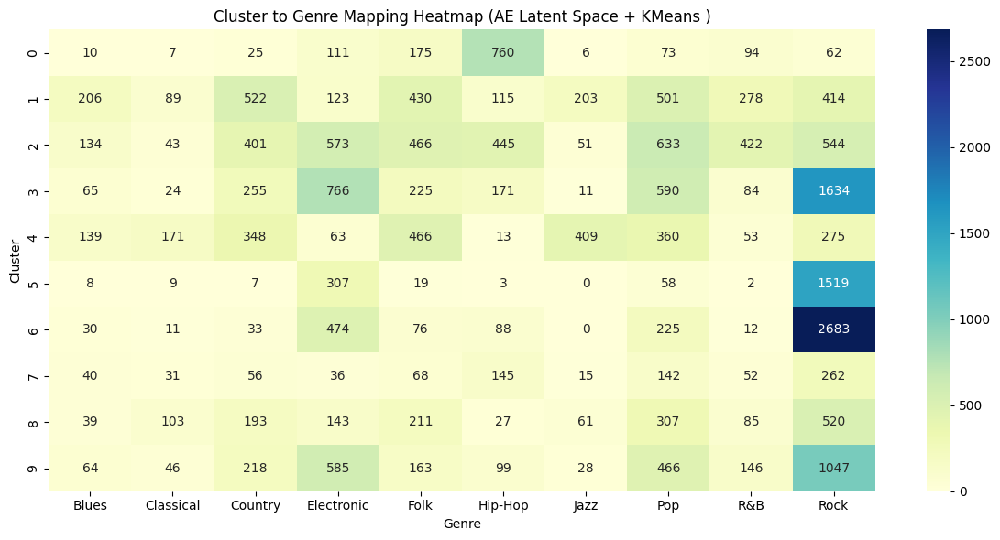


Cluster Composition Percentages (AE Latent Space + KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        0.755858   0.529101   1.889645    8.390023  13.227513  57.445200   
1        7.150295   3.089205  18.118709    4.269351  14.925373   3.991670   
2        3.609914   1.158405  10.802802   15.436422  12.553879  11.988147   
3        1.699346   0.627451   6.666667   20.026144   5.882353   4.470588   
4        6.051371   7.444493  15.150196    2.742708  20.287331   0.565956   
5        0.414079   0.465839   0.362319   15.890269   0.983437   0.155280   
6        0.825991   0.302863   0.908590   13.050661   2.092511   2.422907   
7        4.722550   3.659976   6.611570    4.250295   8.028335  17.119244   
8        2.309059   6.098283  11.426880    8.466548  12.492599   1.598579   
9        2.236198   1.607268   7.617051   20.440252   5.695318   3.459119   



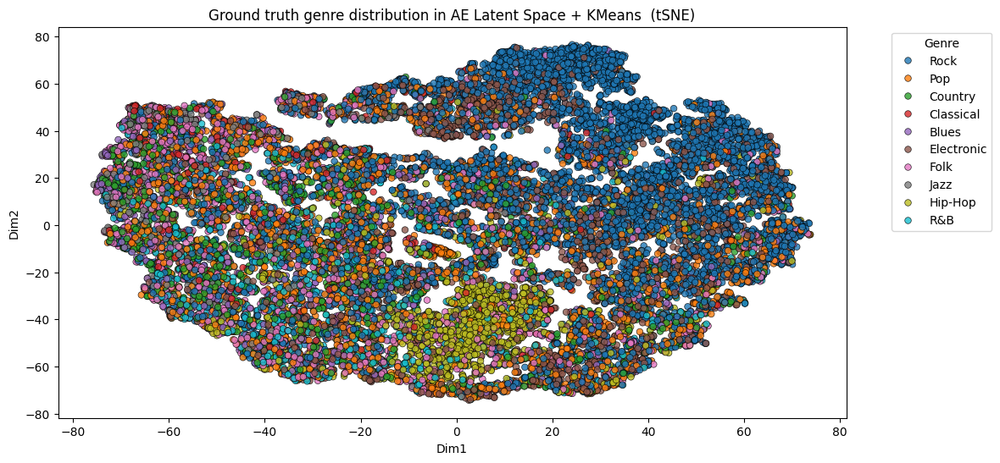

===== Numeric counts per Ground Truth Genre (AE Latent Space + KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (AE Latent Space + KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


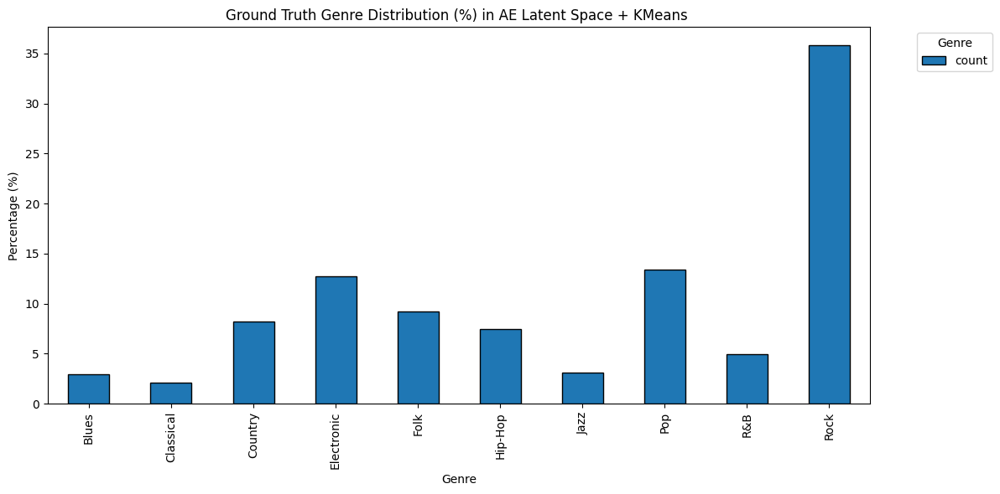

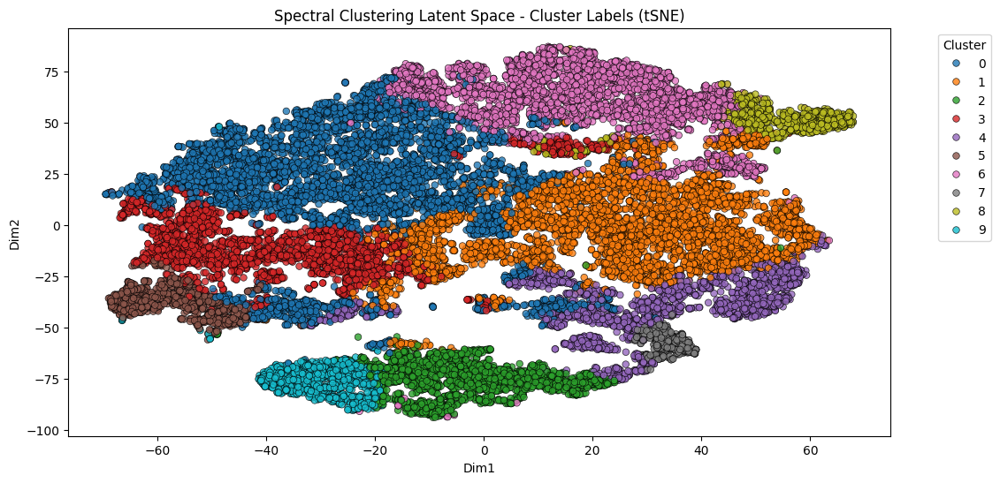

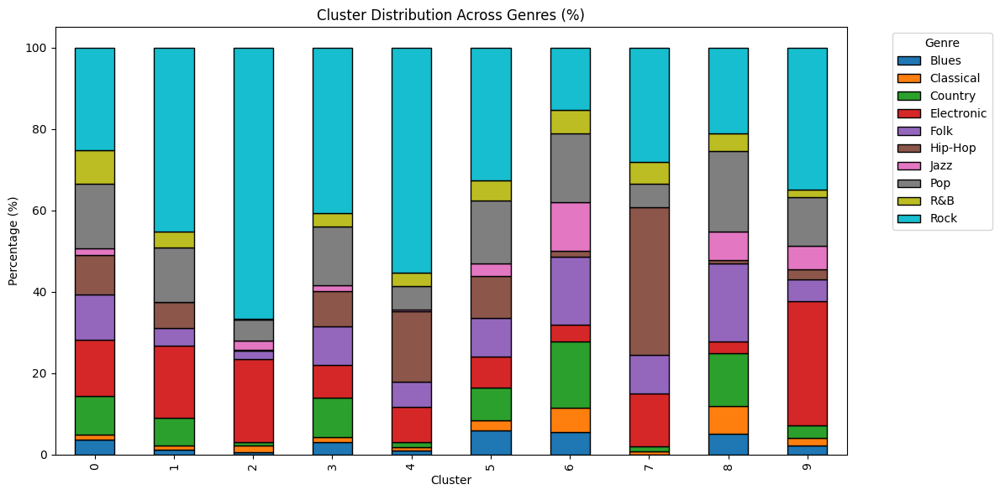

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0        227         79      576         863   688      591   104  974  509   
1         66         55      360         927   235      331     7  703  214   
2         11         29       17         374    38        6    41   94    3   
3         81         38      259         223   257      234    41  392   89   
4         23         17       27         186   132      372     7  123   73   
5         56         23       75          72    90       96    29  145   47   
6        211        220      611         158   623       57   445  632  221   
7          0          3        5          54    39      149     0   24   22   
8         38         52       98          23   144        7    53  150   33   
9         22         18       30         301    53       23    57  118   17   

genre  Rock  


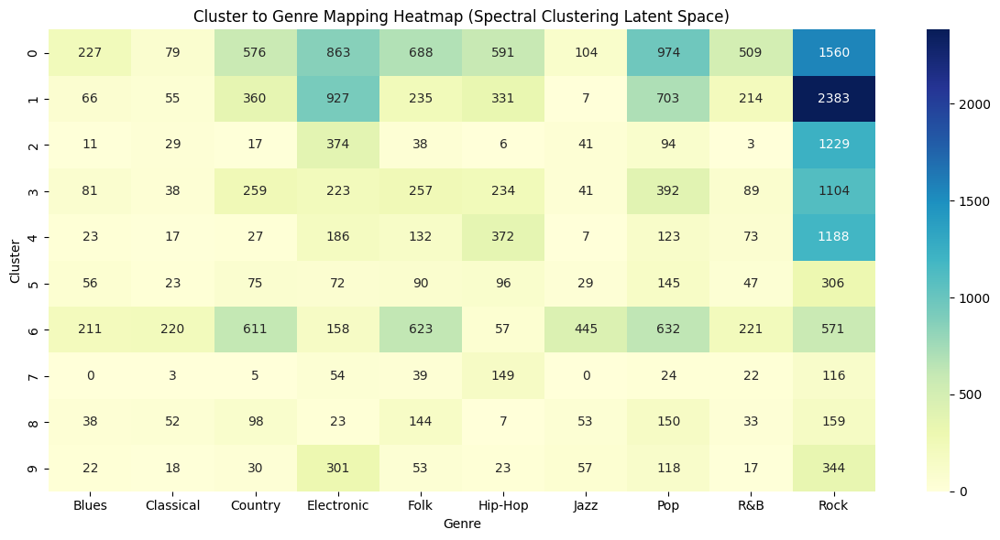


Cluster Composition Percentages (Spectral Clustering Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        3.678496   1.280181   9.333982   13.984767  11.148922   9.577054   
1        1.249763   1.041469   6.816891   17.553494   4.449915   6.267752   
2        0.597177   1.574376   0.922910   20.304017   2.062975   0.325733   
3        2.980132   1.398087   9.529065    8.204562   9.455482   8.609272   
4        1.070764   0.791434   1.256983    8.659218   6.145251  17.318436   
5        5.963791   2.449414   7.987220    7.667732   9.584665  10.223642   
6        5.628168   5.868232  16.297679    4.214457  16.617765   1.520405   
7        0.000000   0.728155   1.213592   13.106796   9.466019  36.165049   
8        5.019815   6.869221  12.945839    3.038309  19.022457   0.924703   
9        2.238047   1.831129   3.051882   30.620549   5.391658   2.3397

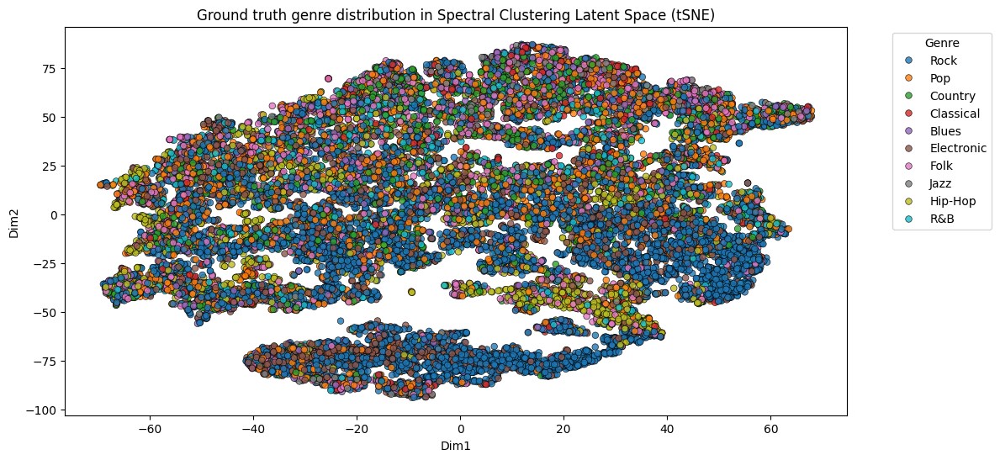

===== Numeric counts per Ground Truth Genre (Spectral Clustering Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (Spectral Clustering Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


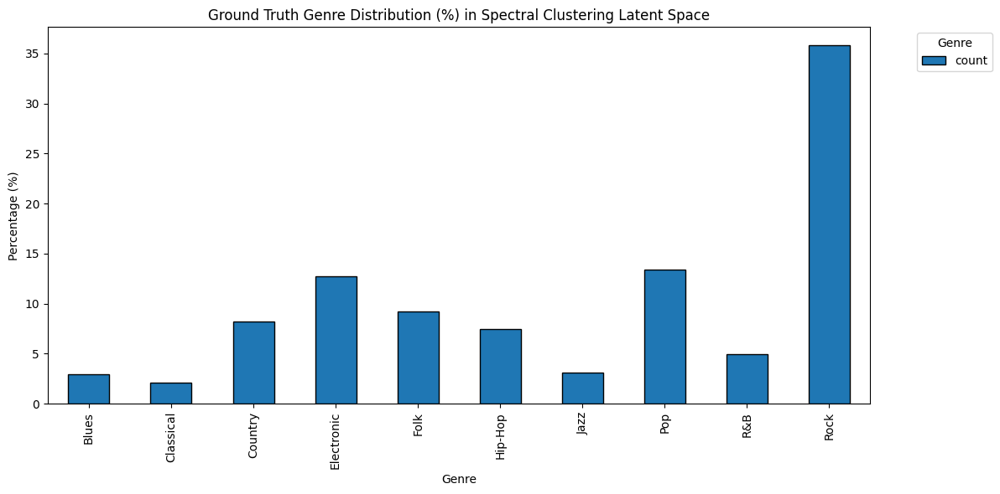

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE

def visualize_and_map_clusters(latent_features, cluster_labels, true_labels, title_prefix="Latent Space"):

    tsne = TSNE(n_components=2, perplexity=80, random_state=42)
    features_2d = tsne.fit_transform(latent_features)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=cluster_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"{title_prefix} - Cluster Labels (tSNE)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    cluster_genre = pd.DataFrame({
        'cluster': cluster_labels,
        'genre': true_labels
    })
    
    # Create contingency table
    cluster_counts = pd.crosstab(cluster_genre['cluster'], cluster_genre['genre'])
    
    # Convert to percentage
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
    
    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(12,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title("Cluster Distribution Across Genres (%)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    cluster_to_genre = pd.crosstab(cluster_labels, true_labels)
    print(f"===== Cluster to Genre Mapping =====")
    print(cluster_to_genre)

    # Heatmap of cluster vs genre
    plt.figure(figsize=(12,6))
    sns.heatmap(cluster_to_genre, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster to Genre Mapping Heatmap ({title_prefix})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.tight_layout()
    plt.show()
    
    print(f"\nCluster Composition Percentages ({title_prefix}) Experimental:")
    print(cluster_percent)
    
    predominant = cluster_to_genre.idxmax(axis=1)
    print("\nPredominant genre per cluster:")
    print(predominant)

    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=true_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"Ground truth genre distribution in {title_prefix} (tSNE)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    # Numeric counts and stacked bar for ground truth
    gt_counts = pd.crosstab(index=true_labels, columns="count")
    print(f"===== Numeric counts per Ground Truth Genre ({title_prefix}) =====")
    print(gt_counts)
    
    gt_percent = gt_counts.div(gt_counts.sum(axis=0), axis=1) * 100
    print(f"\nGround Truth Genre Distribution Percentages ({title_prefix}):")
    print(gt_percent)
    
    gt_percent.plot(
        kind='bar', stacked=True, figsize=(12,6),
        colormap='tab10', edgecolor='black'
    )
    plt.title(f"Ground Truth Genre Distribution (%) in {title_prefix}")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Genre")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    


# For PCA + KMeans clusters
visualize_and_map_clusters(X_pca, labels_pca, df['genre'], title_prefix="PCA Latent Space + KMeans ")

# For CVAE latent features
visualize_and_map_clusters(latent_features, cluster_labels, df['genre'], title_prefix="CVAE Latent Space")

# For AE + KMeans clusters
visualize_and_map_clusters(latent_ae, labels_ae, df['genre'], title_prefix="AE Latent Space + KMeans ")

# For Spectral Clustering
visualize_and_map_clusters(latent_features, spectral_labels, df['genre'], title_prefix="Spectral Clustering Latent Space")


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


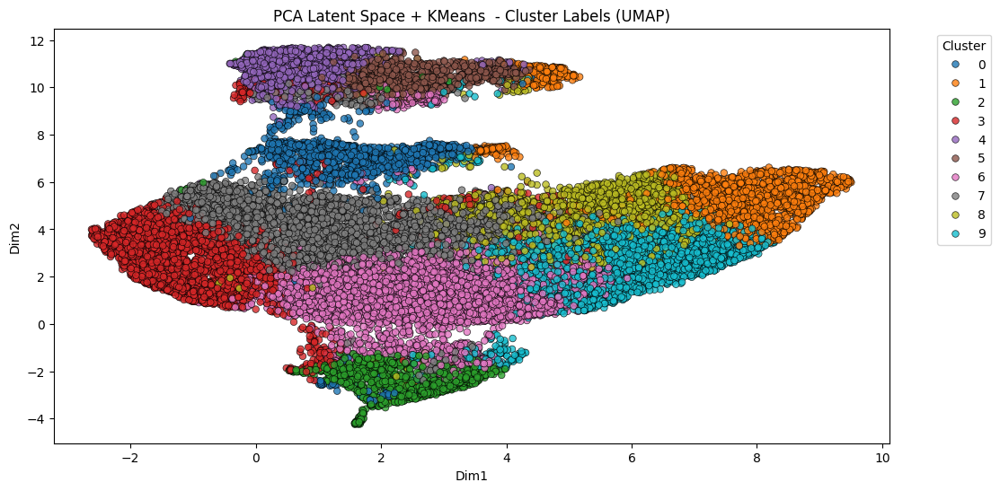

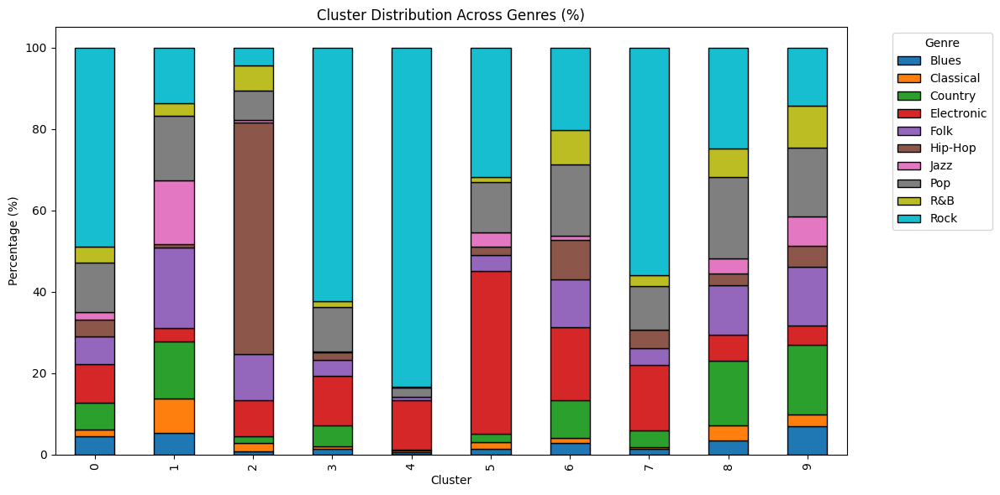

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         71         25      102         150   105       65    29  189   61   
1        125        198      326          79   461       19   367  373   71   
2         11         33       23         134   170      853    11  107   93   
3         47         19      160         386   118       62     4  346   42   
4          8          5        5         173    12        0     0   35    1   
5         16         21       24         478    47       26    41  148   16   
6        133         53      437         825   549      445    51  813  390   
7         57         22      180         694   182      195     2  465  118   
8         71         73      320         125   245       58    75  400  142   
9        196         85      481         137   410      143   204  479  294   

genre  Rock  


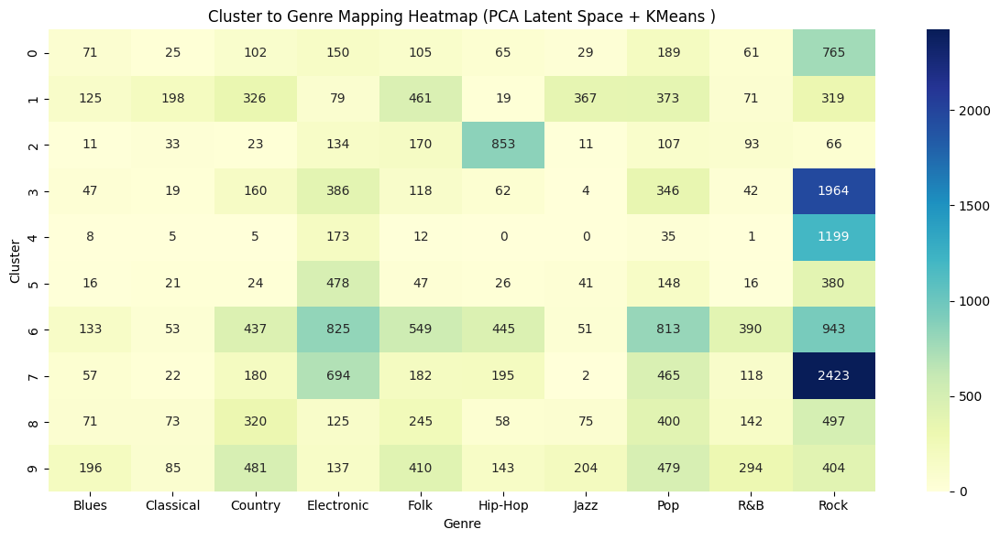


Cluster Composition Percentages (PCA Latent Space + KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        4.545455   1.600512   6.530090    9.603073   6.722151   4.161332   
1        5.346450   8.468777  13.943541    3.378956  19.717707   0.812660   
2        0.732845   2.198534   1.532312    8.927382  11.325783  56.828781   
3        1.493011   0.603558   5.082592   12.261753   3.748412   1.969504   
4        0.556328   0.347705   0.347705   12.030598   0.834492   0.000000   
5        1.336675   1.754386   2.005013   39.933166   3.926483   2.172097   
6        2.866997   1.142488   9.420134   17.784005  11.834447   9.592585   
7        1.313970   0.507146   4.149378   15.998156   4.195482   4.495159   
8        3.539382   3.639083  15.952144    6.231306  12.213360   2.891326   
9        6.918461   3.000353  16.978468    4.835863  14.472291   5.047653   


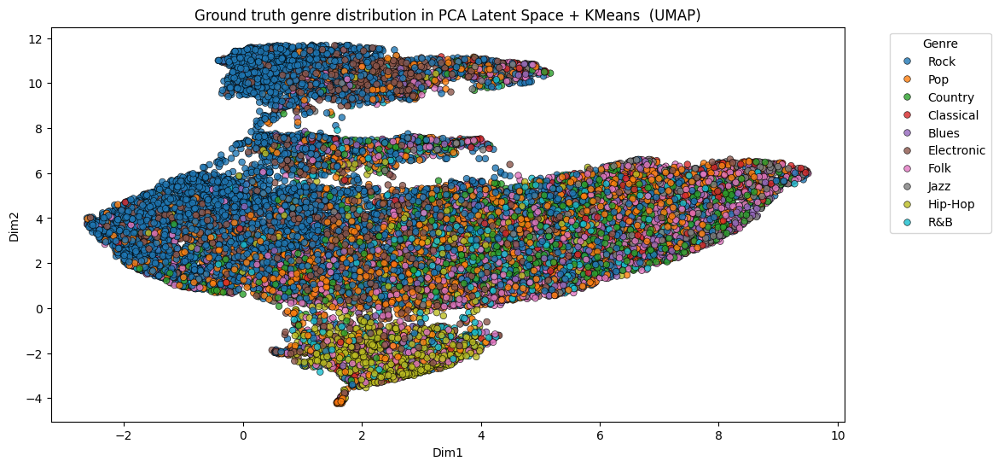

===== Numeric counts per Ground Truth Genre (PCA Latent Space + KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (PCA Latent Space + KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


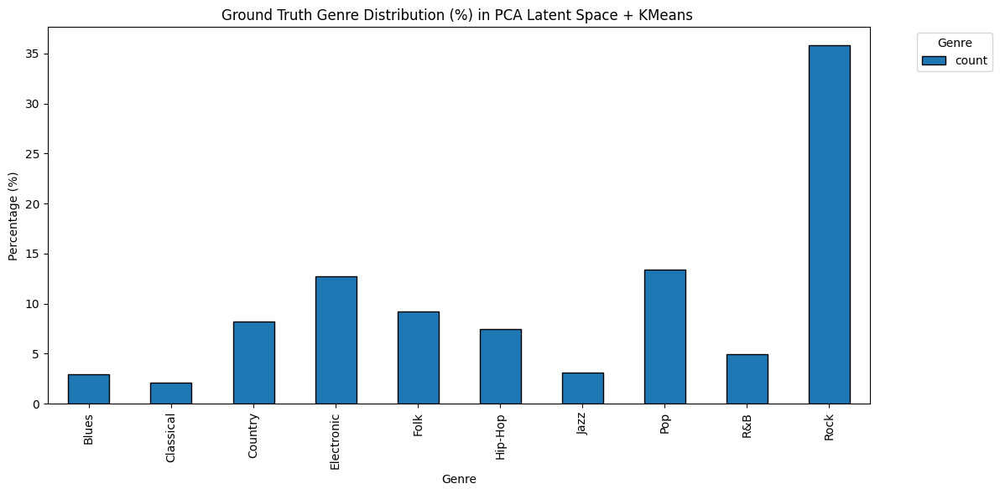

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


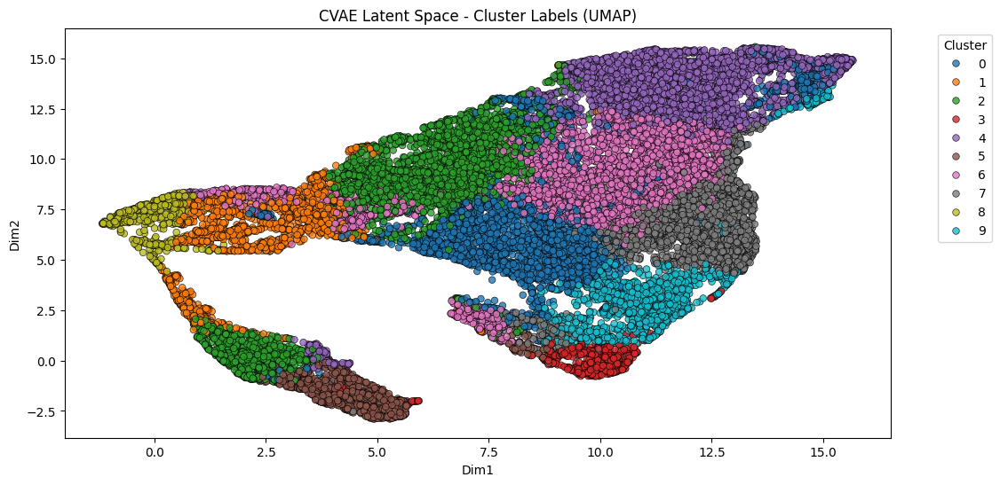

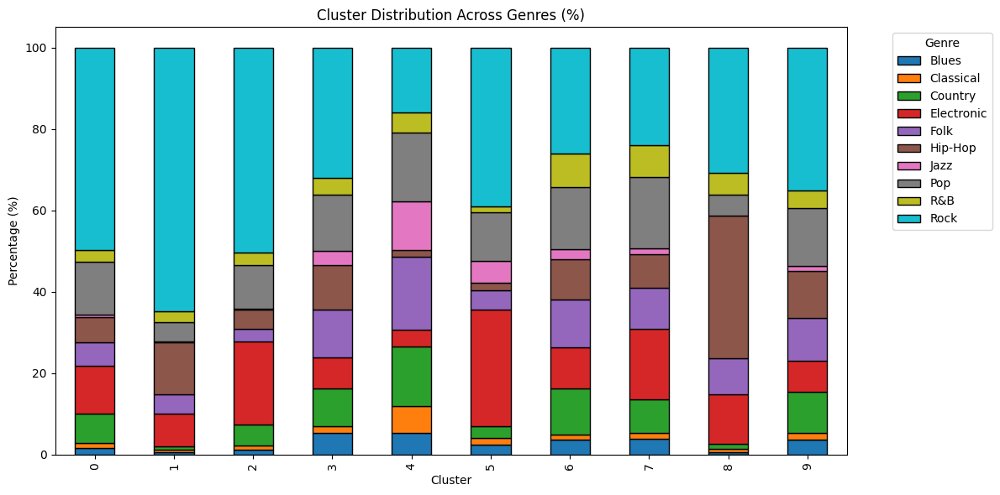

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         51         44      231         382   188      196    25  416  100   
1         12         12       14         153    88      241     2   91   50   
2         52         47      223         887   138      203    11  464  139   
3         31         10       55          44    70       64    20   82   24   
4        214        268      590         165   723       69   480  682  200   
5         32         24       37         389    63       26    70  162   21   
6        166         54      494         451   513      435   112  678  364   
7        115         45      247         520   298      248    45  526  234   
8          3          5        7          70    52      202     0   30   30   
9         59         25      160         120   166      182    19  224   66   

genre  Rock  


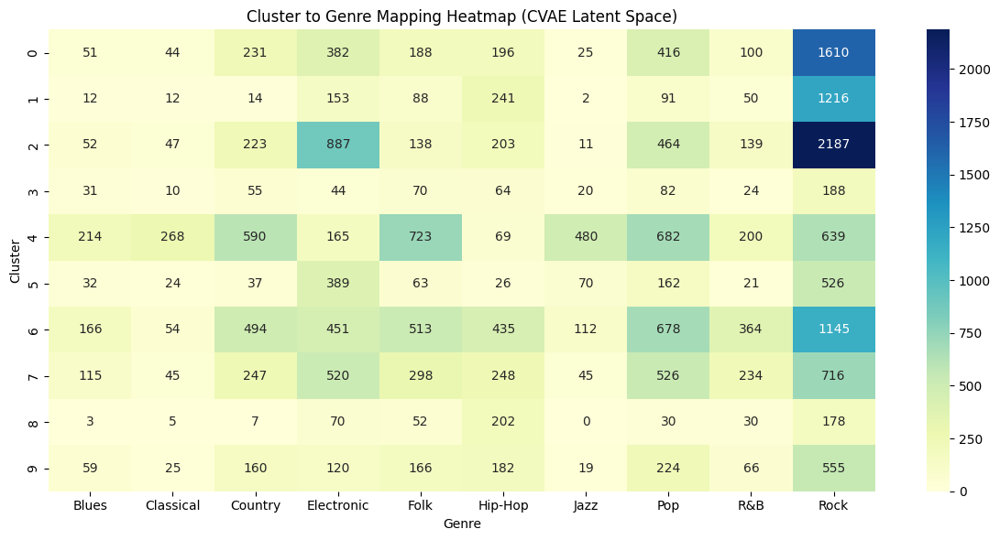


Cluster Composition Percentages (CVAE Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        1.572618   1.356768   7.123034   11.779217   5.797101   6.043787   
1        0.638638   0.638638   0.745077    8.142629   4.683342  12.825971   
2        1.195128   1.080211   5.125259   20.386118   3.171685   4.665594   
3        5.272109   1.700680   9.353741    7.482993  11.904762  10.884354   
4        5.310174   6.650124  14.640199    4.094293  17.940447   1.712159   
5        2.370370   1.777778   2.740741   28.814815   4.666667   1.925926   
6        3.762466   1.223935  11.196736   10.222121  11.627380   9.859474   
7        3.841015   1.503006   8.249833   17.368069   9.953240   8.283233   
8        0.519931   0.866551   1.213172   12.131716   9.012132  35.008666   
9        3.743655   1.586294  10.152284    7.614213  10.532995  11.548223   

genre   

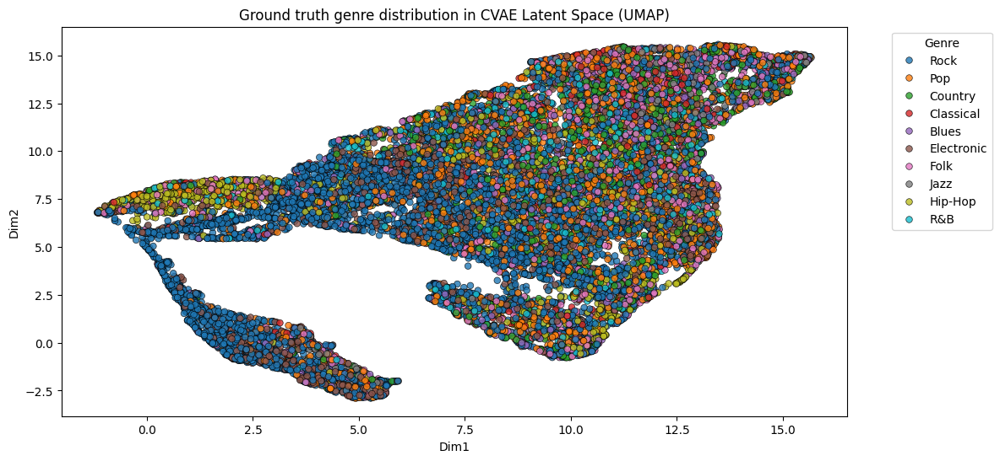

===== Numeric counts per Ground Truth Genre (CVAE Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (CVAE Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


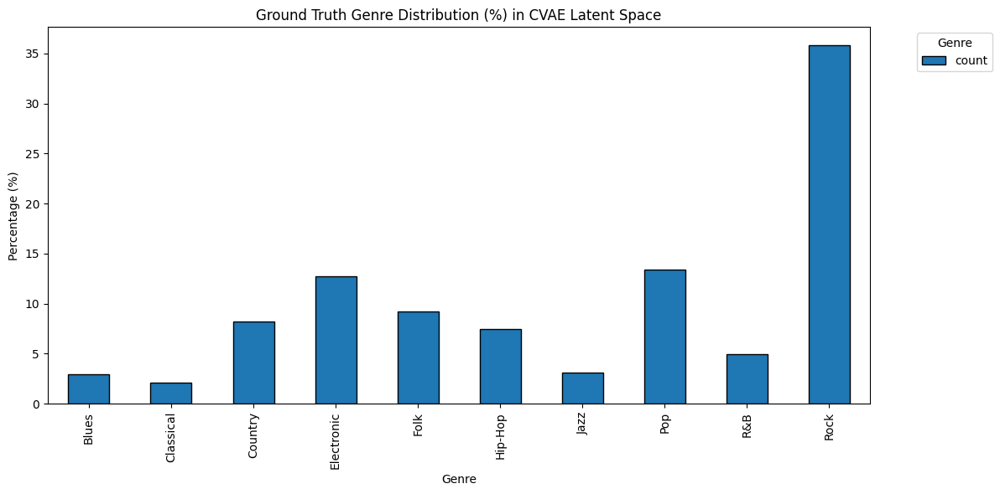

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


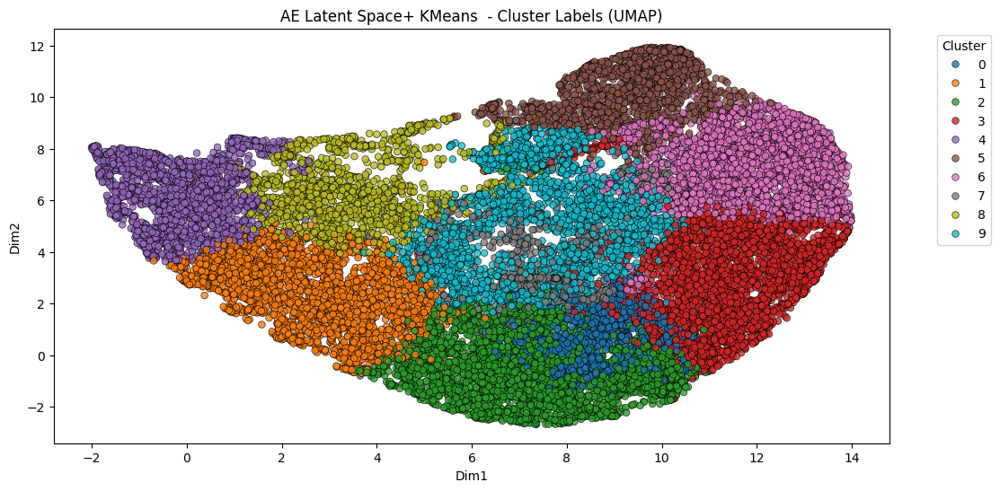

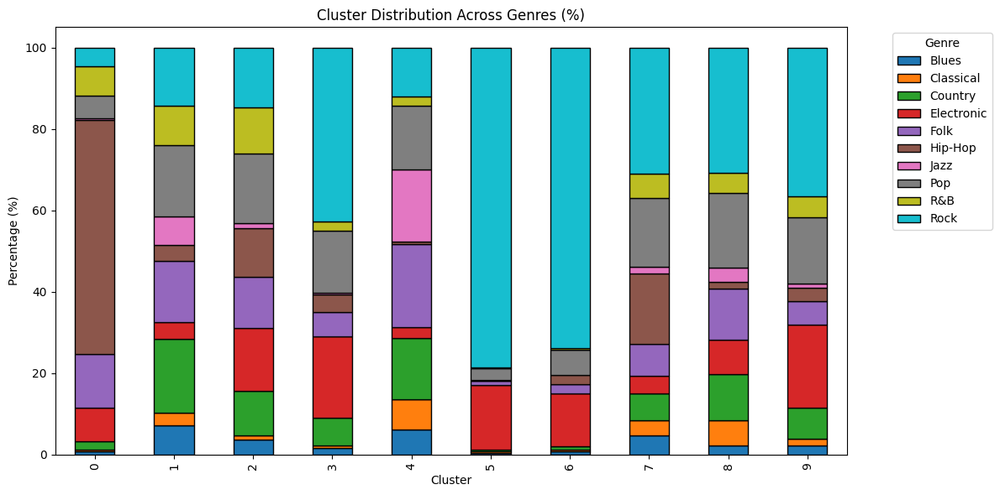

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0         10          7       25         111   175      760     6   73   94   
1        206         89      522         123   430      115   203  501  278   
2        134         43      401         573   466      445    51  633  422   
3         65         24      255         766   225      171    11  590   84   
4        139        171      348          63   466       13   409  360   53   
5          8          9        7         307    19        3     0   58    2   
6         30         11       33         474    76       88     0  225   12   
7         40         31       56          36    68      145    15  142   52   
8         39        103      193         143   211       27    61  307   85   
9         64         46      218         585   163       99    28  466  146   

genre  Rock  


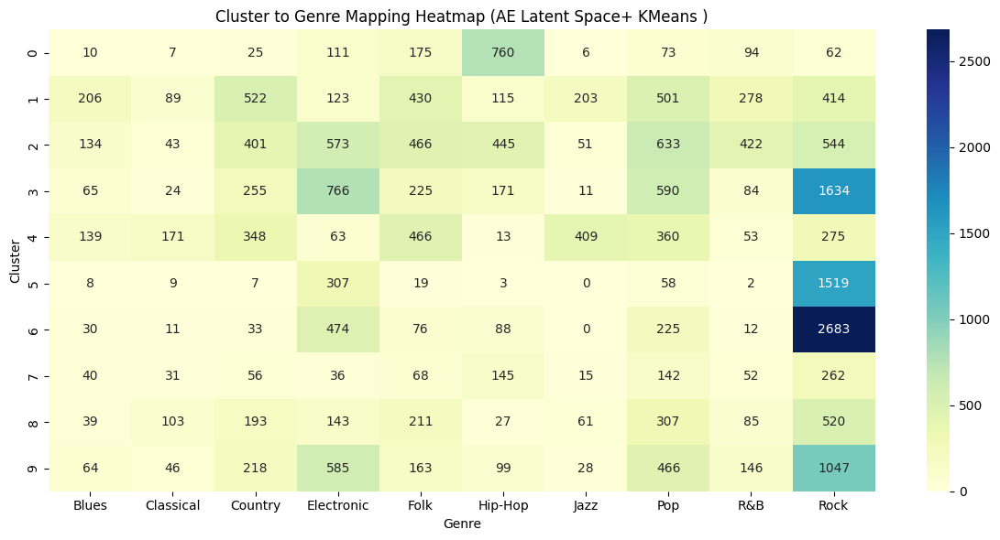


Cluster Composition Percentages (AE Latent Space+ KMeans ) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        0.755858   0.529101   1.889645    8.390023  13.227513  57.445200   
1        7.150295   3.089205  18.118709    4.269351  14.925373   3.991670   
2        3.609914   1.158405  10.802802   15.436422  12.553879  11.988147   
3        1.699346   0.627451   6.666667   20.026144   5.882353   4.470588   
4        6.051371   7.444493  15.150196    2.742708  20.287331   0.565956   
5        0.414079   0.465839   0.362319   15.890269   0.983437   0.155280   
6        0.825991   0.302863   0.908590   13.050661   2.092511   2.422907   
7        4.722550   3.659976   6.611570    4.250295   8.028335  17.119244   
8        2.309059   6.098283  11.426880    8.466548  12.492599   1.598579   
9        2.236198   1.607268   7.617051   20.440252   5.695318   3.459119   

g

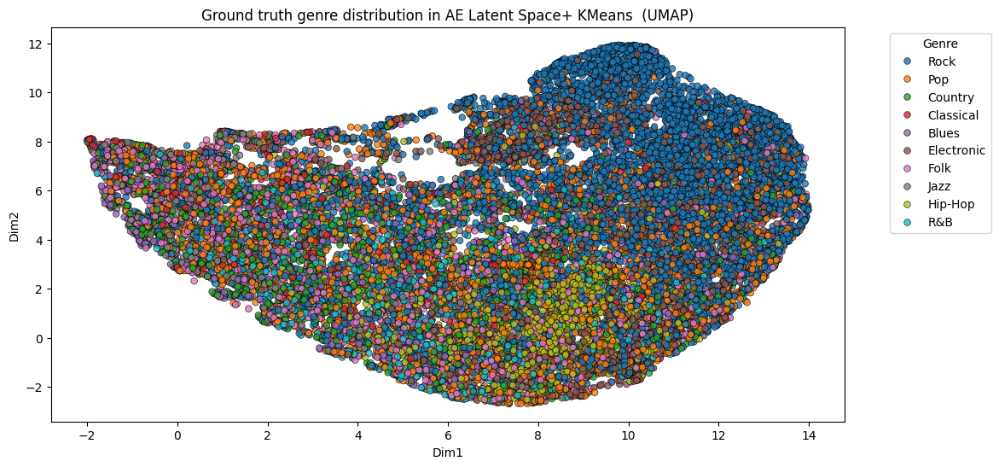

===== Numeric counts per Ground Truth Genre (AE Latent Space+ KMeans ) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (AE Latent Space+ KMeans ):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


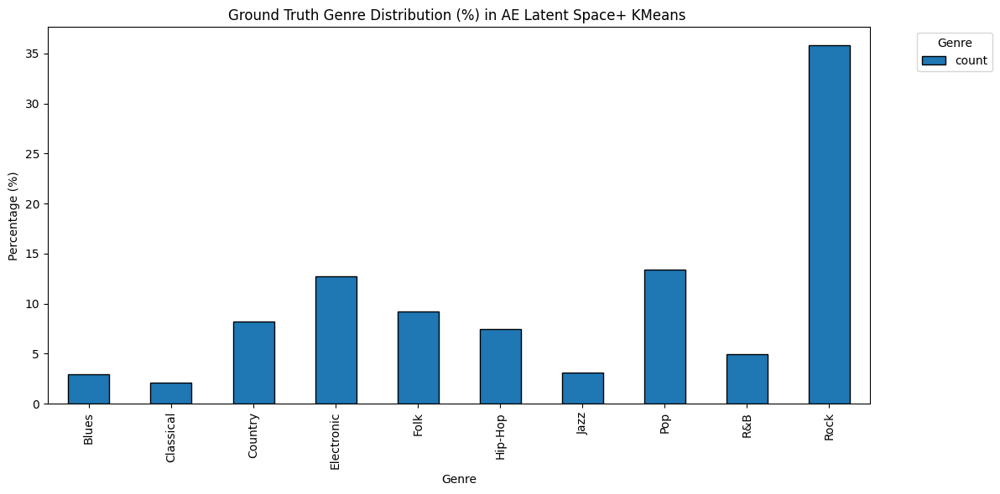

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


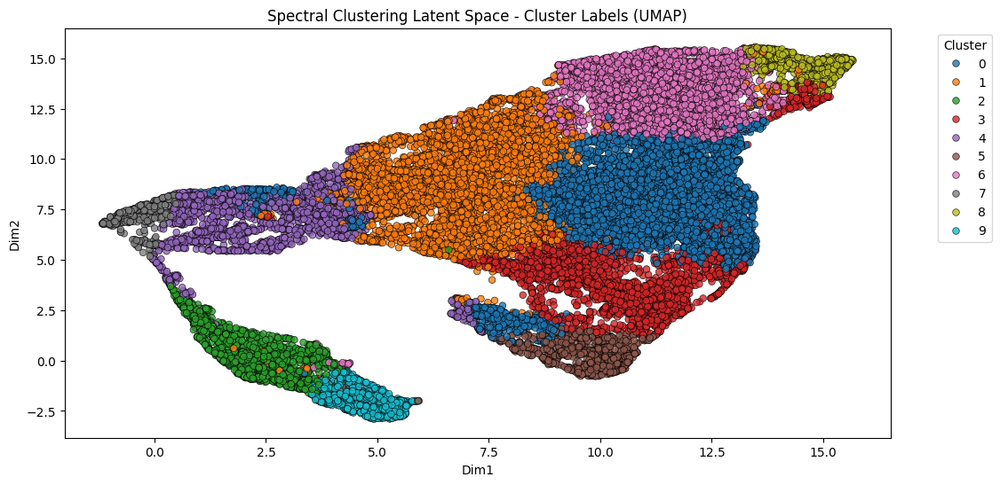

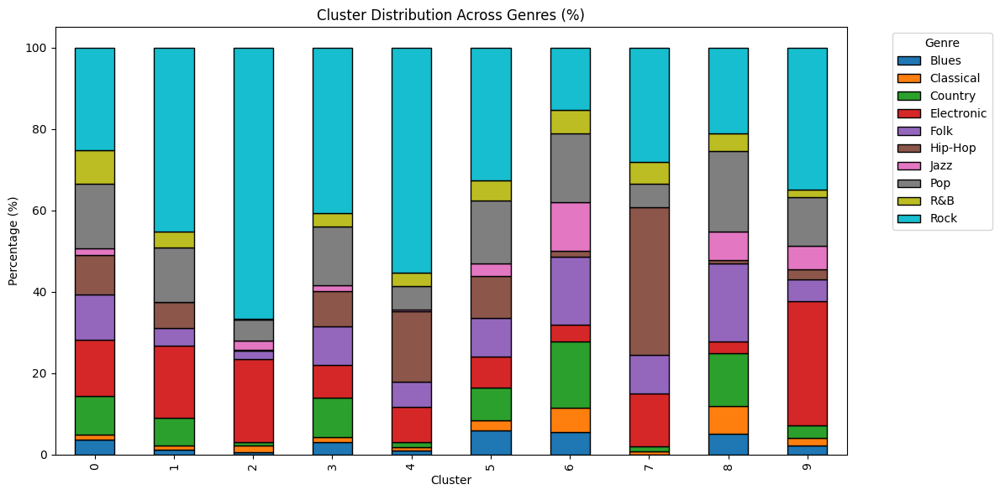

===== Cluster to Genre Mapping =====
genre  Blues  Classical  Country  Electronic  Folk  Hip-Hop  Jazz  Pop  R&B  \
row_0                                                                         
0        227         79      576         863   688      591   104  974  509   
1         66         55      360         927   235      331     7  703  214   
2         11         29       17         374    38        6    41   94    3   
3         81         38      259         223   257      234    41  392   89   
4         23         17       27         186   132      372     7  123   73   
5         56         23       75          72    90       96    29  145   47   
6        211        220      611         158   623       57   445  632  221   
7          0          3        5          54    39      149     0   24   22   
8         38         52       98          23   144        7    53  150   33   
9         22         18       30         301    53       23    57  118   17   

genre  Rock  


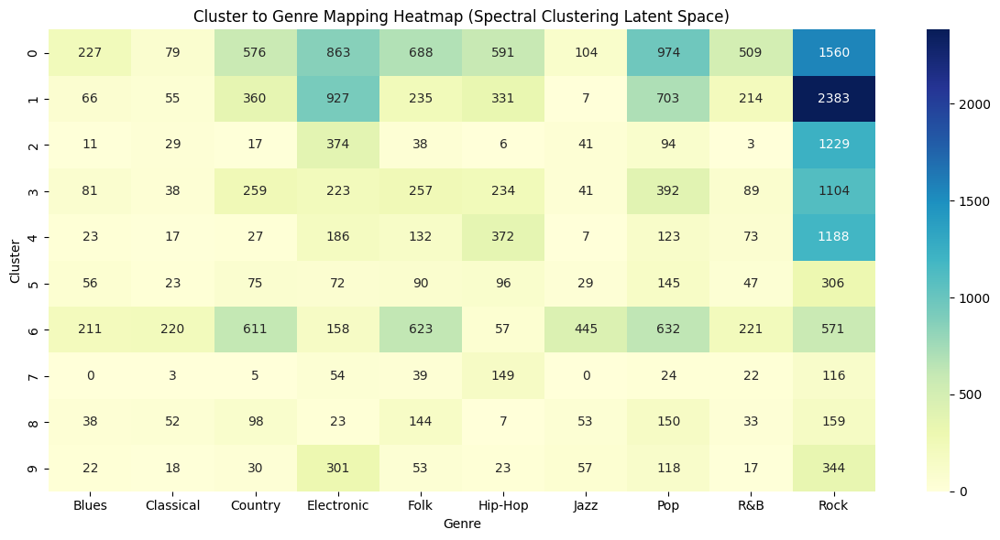


Cluster Composition Percentages (Spectral Clustering Latent Space) Experimental:
genre       Blues  Classical    Country  Electronic       Folk    Hip-Hop  \
cluster                                                                     
0        3.678496   1.280181   9.333982   13.984767  11.148922   9.577054   
1        1.249763   1.041469   6.816891   17.553494   4.449915   6.267752   
2        0.597177   1.574376   0.922910   20.304017   2.062975   0.325733   
3        2.980132   1.398087   9.529065    8.204562   9.455482   8.609272   
4        1.070764   0.791434   1.256983    8.659218   6.145251  17.318436   
5        5.963791   2.449414   7.987220    7.667732   9.584665  10.223642   
6        5.628168   5.868232  16.297679    4.214457  16.617765   1.520405   
7        0.000000   0.728155   1.213592   13.106796   9.466019  36.165049   
8        5.019815   6.869221  12.945839    3.038309  19.022457   0.924703   
9        2.238047   1.831129   3.051882   30.620549   5.391658   2.3397

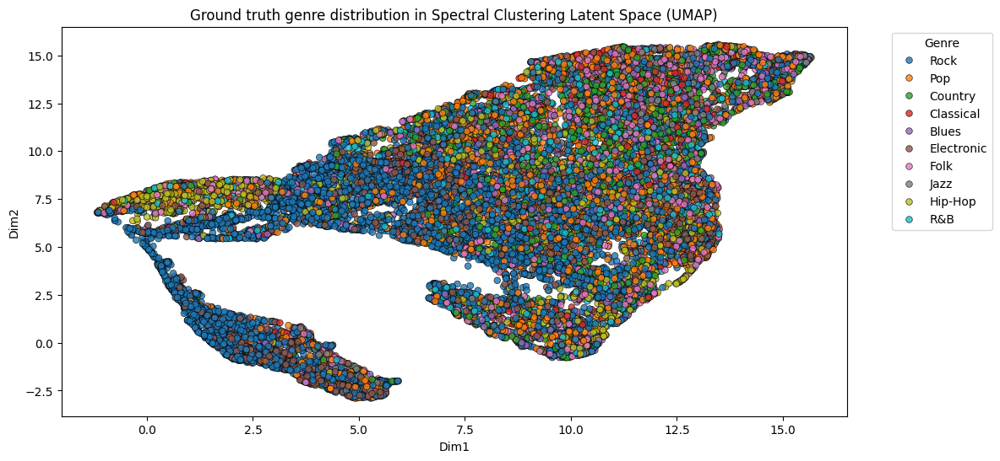

===== Numeric counts per Ground Truth Genre (Spectral Clustering Latent Space) =====
col_0       count
genre            
Blues         735
Classical     534
Country      2058
Electronic   3181
Folk         2299
Hip-Hop      1866
Jazz          784
Pop          3355
R&B          1228
Rock         8960

Ground Truth Genre Distribution Percentages (Spectral Clustering Latent Space):
col_0        count
genre             
Blues        2.940
Classical    2.136
Country      8.232
Electronic  12.724
Folk         9.196
Hip-Hop      7.464
Jazz         3.136
Pop         13.420
R&B          4.912
Rock        35.840


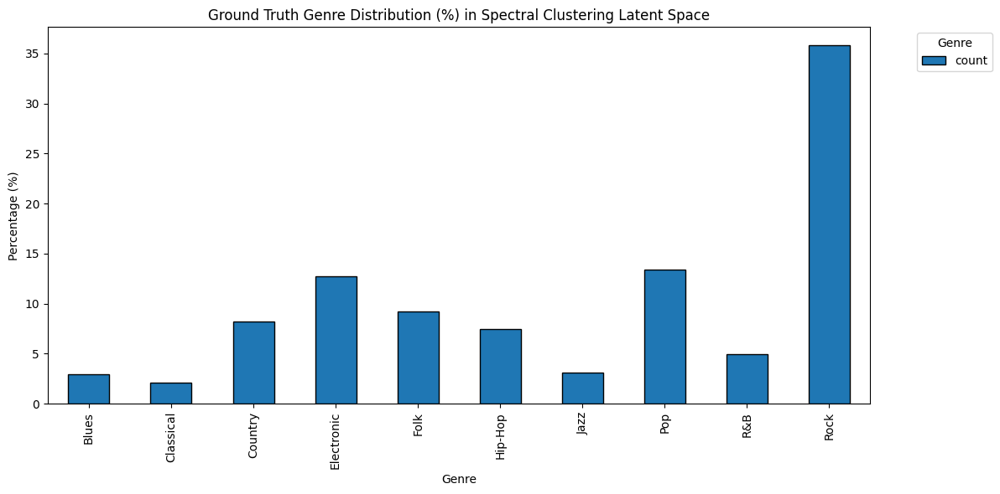

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE

def visualize_and_map_clusters(latent_features, cluster_labels, true_labels, title_prefix="Latent Space"):

    reducer = umap.UMAP(n_components=2, n_neighbors= 15, min_dist=0.1,random_state=42)
    features_2d = reducer.fit_transform(latent_features)
    
    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=cluster_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"{title_prefix} - Cluster Labels (UMAP)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    cluster_genre = pd.DataFrame({
        'cluster': cluster_labels,
        'genre': true_labels
    })
    
    # Create contingency table
    cluster_counts = pd.crosstab(cluster_genre['cluster'], cluster_genre['genre'])
    
    # Convert to percentage
    cluster_percent = cluster_counts.div(cluster_counts.sum(axis=1), axis=0) * 100
    
    # Plot stacked bar chart
    cluster_percent.plot(
        kind='bar',
        stacked=True,
        figsize=(12,6),
        colormap='tab10',
        edgecolor='black'
    )
    
    plt.title("Cluster Distribution Across Genres (%)")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Cluster")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    cluster_to_genre = pd.crosstab(cluster_labels, true_labels)
    print(f"===== Cluster to Genre Mapping =====")
    print(cluster_to_genre)

    # Heatmap of cluster vs genre
    plt.figure(figsize=(12,6))
    sns.heatmap(cluster_to_genre, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
    plt.title(f"Cluster to Genre Mapping Heatmap ({title_prefix})")
    plt.ylabel("Cluster")
    plt.xlabel("Genre")
    plt.tight_layout()
    plt.show()
    
    print(f"\nCluster Composition Percentages ({title_prefix}) Experimental:")
    print(cluster_percent)
    
    predominant = cluster_to_genre.idxmax(axis=1)
    print("\nPredominant genre per cluster:")
    print(predominant)

    plt.figure(figsize=(12,6))
    sns.scatterplot(x=features_2d[:,0], y=features_2d[:,1], hue=true_labels, palette='tab10', s=30, alpha=0.8,edgecolor='black',linewidth=0.5)
    plt.title(f"Ground truth genre distribution in {title_prefix} (UMAP)")
    plt.ylabel("Dim2")
    plt.xlabel("Dim1")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

    # Numeric counts and stacked bar for ground truth 
    gt_counts = pd.crosstab(index=true_labels, columns="count")
    print(f"===== Numeric counts per Ground Truth Genre ({title_prefix}) =====")
    print(gt_counts)
    
    gt_percent = gt_counts.div(gt_counts.sum(axis=0), axis=1) * 100
    print(f"\nGround Truth Genre Distribution Percentages ({title_prefix}):")
    print(gt_percent)
    
    gt_percent.plot(
        kind='bar', stacked=True, figsize=(12,6),
        colormap='tab10', edgecolor='black'
    )
    plt.title(f"Ground Truth Genre Distribution (%) in {title_prefix}")
    plt.ylabel("Percentage (%)")
    plt.xlabel("Genre")
    plt.legend(title="Genre", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    


# For PCA + KMeans clusters
visualize_and_map_clusters(X_pca, labels_pca, df['genre'], title_prefix="PCA Latent Space + KMeans ")

# For CVAE latent features
visualize_and_map_clusters(latent_features, cluster_labels, df['genre'], title_prefix="CVAE Latent Space")

# For AE + KMeans clusters
visualize_and_map_clusters(latent_ae, labels_ae, df['genre'], title_prefix="AE Latent Space+ KMeans ")

# For Spectral Clustering
visualize_and_map_clusters(latent_features, spectral_labels, df['genre'], title_prefix="Spectral Clustering Latent Space")
